In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import cv2
from joblib import Parallel, delayed
from sklearn.cluster import OPTICS
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import umap
import joblib
from scipy.signal import correlate
from scipy.spatial.distance import cosine

# Data Loading

In [2]:
t0 = time.time()

def load_and_process_data(filepath, rows, cols):
    raw_data = np.loadtxt(filepath).T
    reshaped_data = np.zeros((raw_data.shape[0], rows, cols))
    
    for i in range(raw_data.shape[0]):
        linear_data = raw_data[i]
        reshaped = linear_data[:rows * cols].reshape(rows, cols)
        reshaped[1::2] = reshaped[1::2, ::-1]  # Reverse odd rows
        reshaped_data[i] = reshaped

    return reshaped_data.transpose(1, 2, 0)

calx = np.arange(800, 1801)
file1 = r"/root/raman clustering data/1-JZ_hres_CAL-NORM-BS-BFG-data_background_filtered.txt"
file2 = r"/root/raman clustering data/2-JZ_hres_CAL-NORM-BS-BFG-data_background_filtered.txt"
file3 = r"/root/raman clustering data/3-JZ_hres_CAL-NORM-BS-BFG-data_background_filtered.txt"
file4 = r"/root/raman clustering data/4-JZ_hres_CAL-NORM-BS-BFG-data_background_filtered.txt"
file5 = r"/root/raman clustering data/5-JZ_hres_CAL-NORM-BS-BFG-data_background_filtered.txt"
file6 = r"/root/raman clustering data/6-JZ_hres_CAL-NORM-BS-BFG-data_background_filtered.txt"
file7 = r"/root/raman clustering data/7-JZ_hres_CAL-NORM-BS-BFG-data_background_filtered.txt"
file8 = r"/root/raman clustering data/8-JZ_hres_CAL-NORM-BS-BFG-data_background_filtered.txt"
file9 = r"/root/raman clustering data/9-JZ_hres_CAL-NORM-BS-BFG-data_background_filtered.txt"
file10 = r"/root/raman clustering data/10-JZ_hres_CAL-NORM-BS-BFG-data_background_filtered.txt"

files_and_dimensions = [
    (file1, 111, 451),
    (file2, 511, 191),
    (file3, 191, 451),
    (file4, 391, 141),
    (file5, 91, 481),
    (file6, 681, 121),
    (file7, 211, 461),
    (file8, 441, 81),
    (file9, 421, 61),
    (file10, 441, 151),
]

reshaped_data = []
for file_path, rows, cols in files_and_dimensions:
    reshaped_data.append(load_and_process_data(file_path, rows, cols))
t1 = time.time()
t1-t0

40.381813764572144

In [3]:
n_samples = []
n_features = []
for i, data in enumerate(reshaped_data):
    n_samples.append(data.shape[0])
    n_features.append(data.shape[1])
n_bands = 1001

In [4]:
reshaped_data[0].shape

(111, 451, 1001)

# UMAP Component Analysis

In [4]:
flattened_data = []
nan_mask = []
non_nan_data = []
reshaped_data_scaled = []
for i, data in enumerate(reshaped_data):
    flattened = data.reshape(-1,n_bands)
    flattened_data.append(flattened)
for i, data in enumerate(flattened_data):
    nan = np.isnan(data)
    nan_mask.append(nan)
for i in np.arange(len(flattened_data)):
    non_nan_data.append(flattened_data[i][~nan_mask[i]].reshape(-1,n_bands))
for i in np.arange(len(flattened_data)):
    scaler = StandardScaler()
    reshaped_data_scaled.append(scaler.fit_transform(non_nan_data[i]))

In [128]:
reshaped_data_scaled[1].shape

(92284, 1001)

In [5]:
t0=time.time()

umap_results = []
for i, data in enumerate(reshaped_data_scaled):
    umap_model = umap.UMAP(metric="cosine", random_state=42, n_components=2, n_jobs=-1)
    umap_result = umap_model.fit_transform(data)
    umap_results.append(umap_result)
    
t1=time.time()
t1-t0

/home/root/anaconda3/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/root/anaconda3/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/root/anaconda3/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/root/anaconda3/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/root/anaconda3/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/root/anaconda3/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting r

630.9813029766083

In [6]:
umap_with_nans = []
umap_valid_rows = []
umap_reshaped = []
for i in np.arange(len(flattened_data)):
    umap_with_nans.append(np.full((flattened_data[i].shape[0], 2), np.nan))
for i in np.arange(len(flattened_data)):
    umap_valid_rows.append(~np.any(nan_mask[i], axis=1))
for i in np.arange(len(flattened_data)):
    umap_with_nans[i][umap_valid_rows[i]] = umap_results[i]
for i in np.arange(len(flattened_data)):
    umap_reshaped.append(umap_with_nans[i].reshape(n_samples[i], n_features[i], 2))

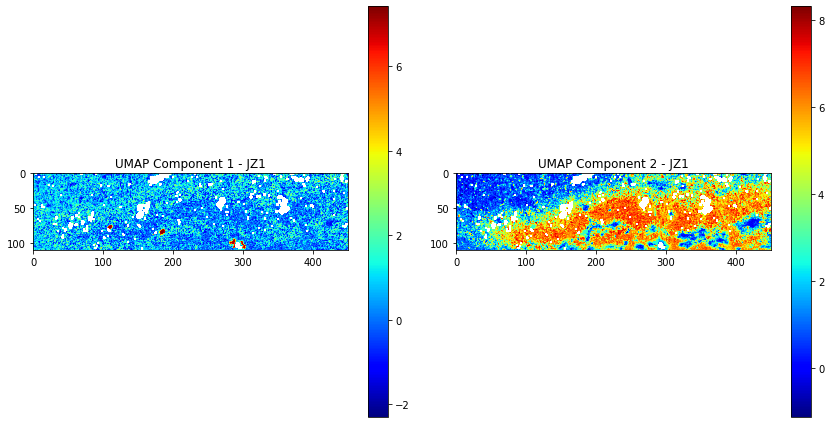

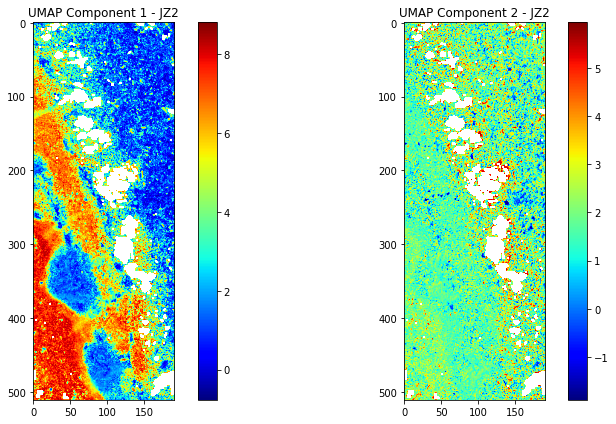

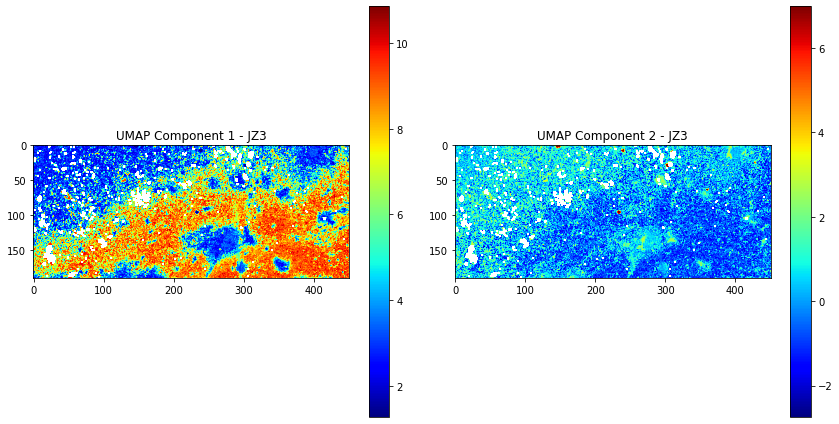

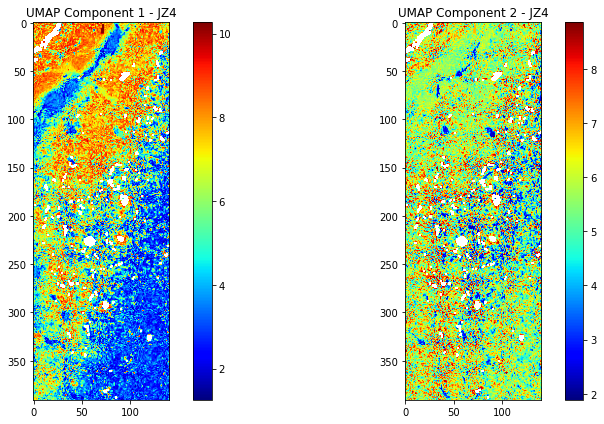

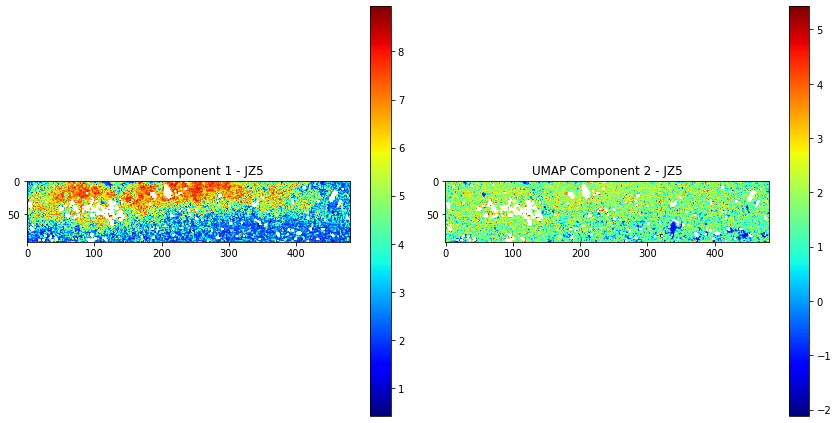

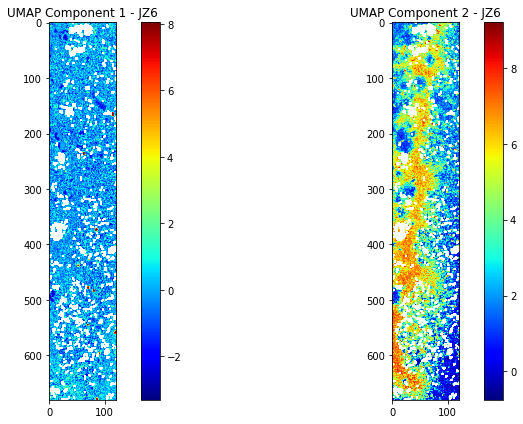

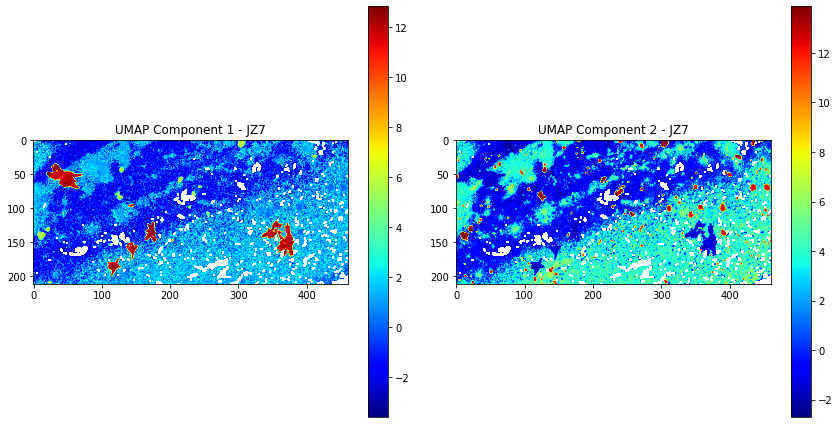

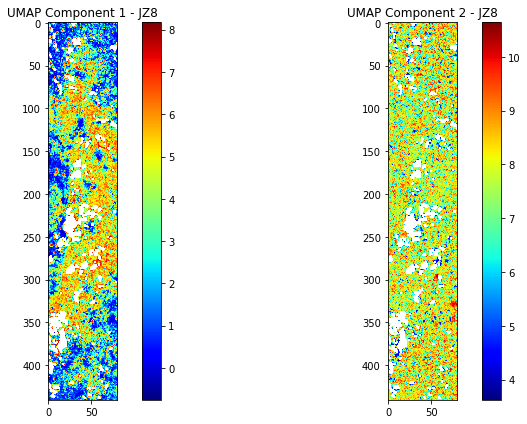

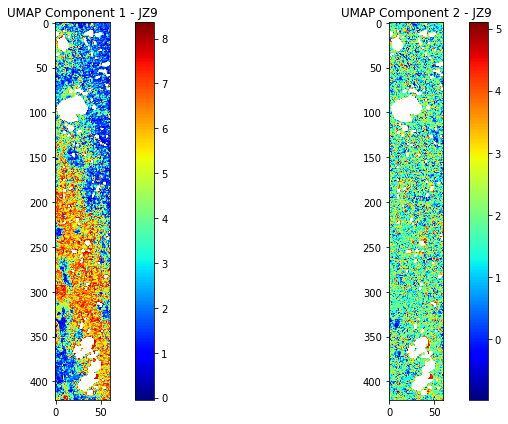

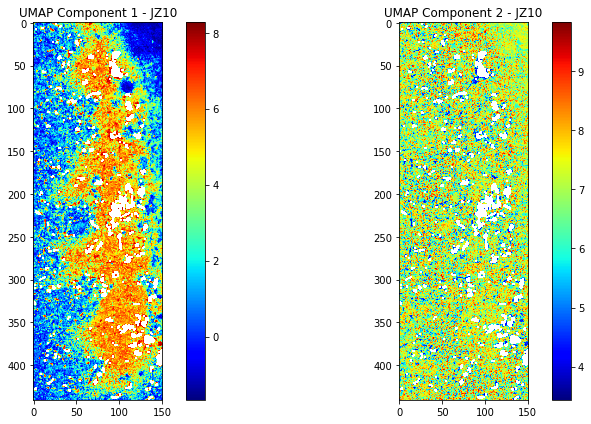

In [8]:
for i, umap_result in enumerate(umap_results):
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(umap_reshaped[i][:, :, 0], cmap='jet')
    plt.colorbar()
    plt.title(f"UMAP Component 1 - JZ{i+1}")

    plt.subplot(1, 2, 2)
    plt.imshow(umap_reshaped[i][:, :, 1], cmap='jet')
    plt.colorbar()
    plt.title(f"UMAP Component 2 - JZ{i+1}")

    plt.tight_layout()
    plt.show()

# UMAP Dimension Visualization

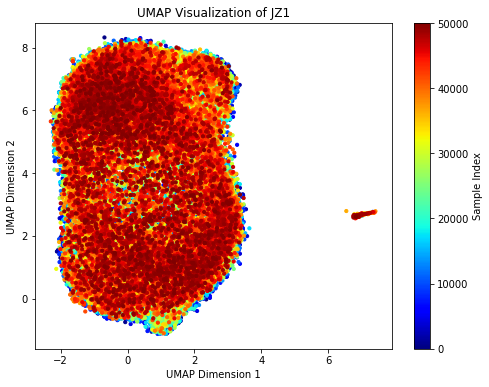

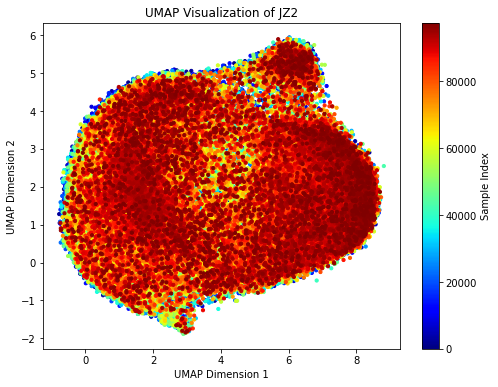

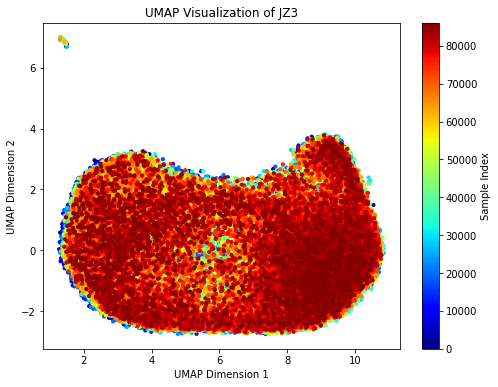

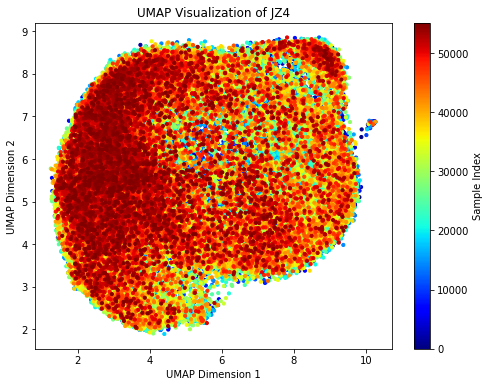

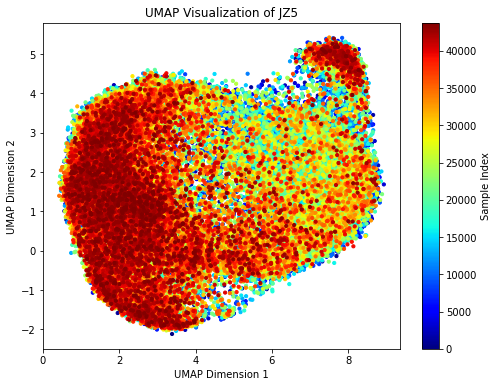

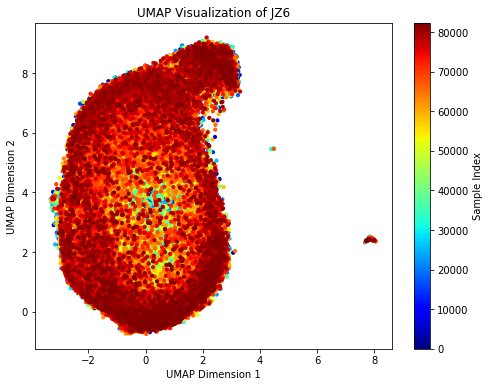

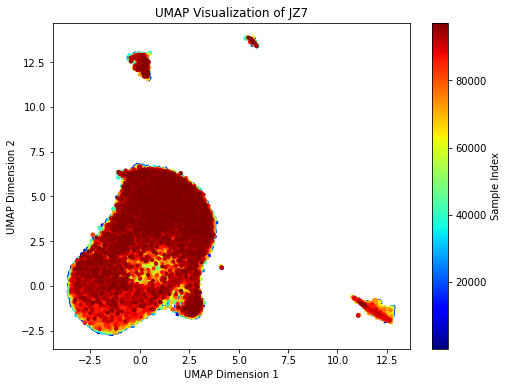

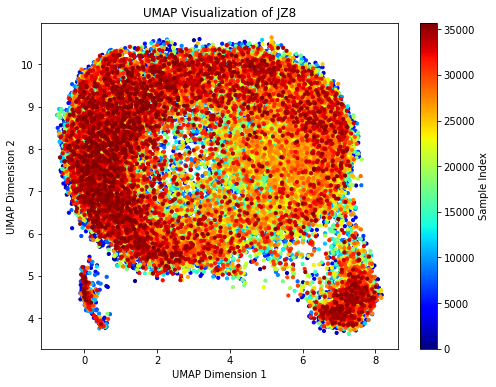

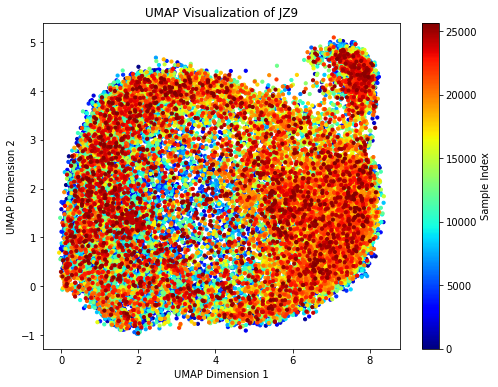

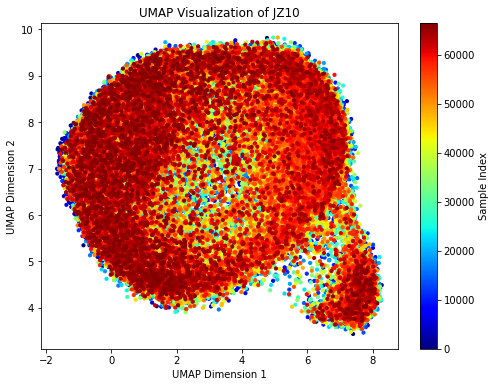

In [9]:
for i, uwn in enumerate(umap_with_nans):
    plt.figure(figsize=(8, 6))
    plt.scatter(uwn[:, 0], uwn[:, 1], c=np.arange(n_samples[i]*n_features[i]), cmap='jet', s=10)
    plt.colorbar(label='Sample Index')
    plt.title(f"UMAP Visualization of JZ{i+1}")
    plt.xlabel("UMAP Dimension 1")
    plt.ylabel("UMAP Dimension 2")
    plt.show()

In [10]:
best_eps_values = [1.06, 0.80, 1.11, 0.86, 0.79, 0.80, 1.13, 0.89, 0.76, 0.78]
# These were found in the silhouette score notebook.

# Clustering by OPTICS

In [29]:
t0=time.time()

clusters_new = []
labels = []
for i in np.arange(len(flattened_data)):
    optics = OPTICS(min_samples=int((n_samples[i]*n_features[i])/20), max_eps=best_eps_values[i], n_jobs=-1)
    clusters_new.append(optics.fit(umap_results[i]))
    labels.append(optics.labels_)

t1=time.time()
t1-t0

4661.929419517517

In [ ]:
joblib.dump(clusters_new, 'clusters_new.joblib')
joblib.dump(umap_results, 'umap_results.joblib')
joblib.dump(labels, 'labels.joblib')

In [7]:
clusters_new = joblib.load('clusters_new.joblib')
labels = joblib.load('labels.joblib')

In [8]:
cluster_with_nans = []
cluster_valid_rows = []
cluster_reshaped = []
for i in np.arange(len(flattened_data)):
    cluster_with_nans.append(np.full((flattened_data[i].shape[0]), np.nan))
for i in np.arange(len(flattened_data)):
    cluster_valid_rows.append(~np.any(nan_mask[i], axis=1))
for i in np.arange(len(flattened_data)):
    cluster_with_nans[i][umap_valid_rows[i]] = clusters_new[i].labels_
for i in np.arange(len(flattened_data)):
    cluster_reshaped.append(cluster_with_nans[i].reshape(n_samples[i], n_features[i]))

# Manual Cluster Matching

In [9]:
for i in np.array([1,7]):
    cluster_reshaped[i][cluster_reshaped[i] == 1] = 3
    cluster_reshaped[i][cluster_reshaped[i] == 2] = 1
    cluster_reshaped[i][cluster_reshaped[i] == 3] = 2
    labels[i][labels[i] == 1] = 3  
    labels[i][labels[i] == 2] = 1   
    labels[i][labels[i] == 3] = 2

In [12]:
reshaped_data[0].shape

(111, 451, 1001)

# OPTICS Results

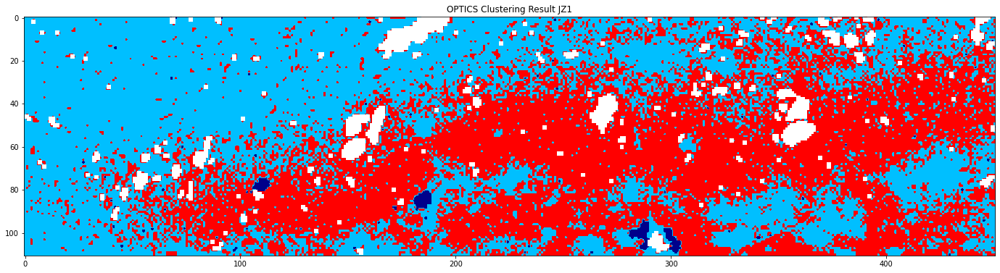

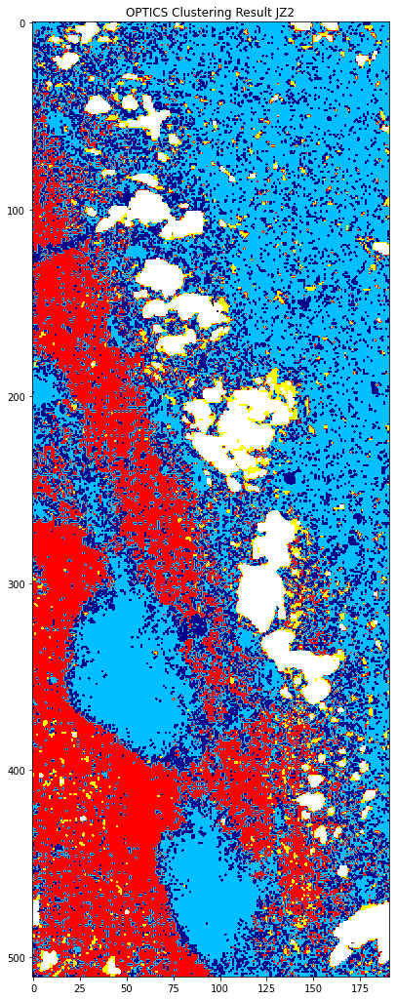

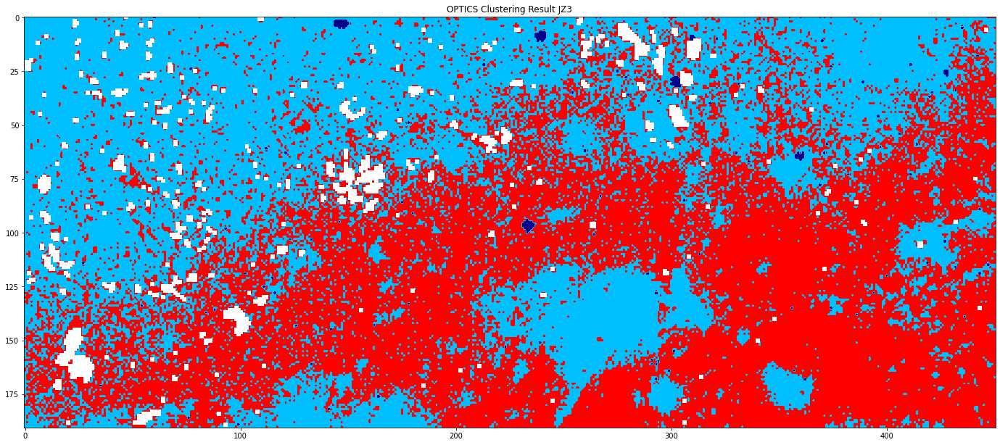

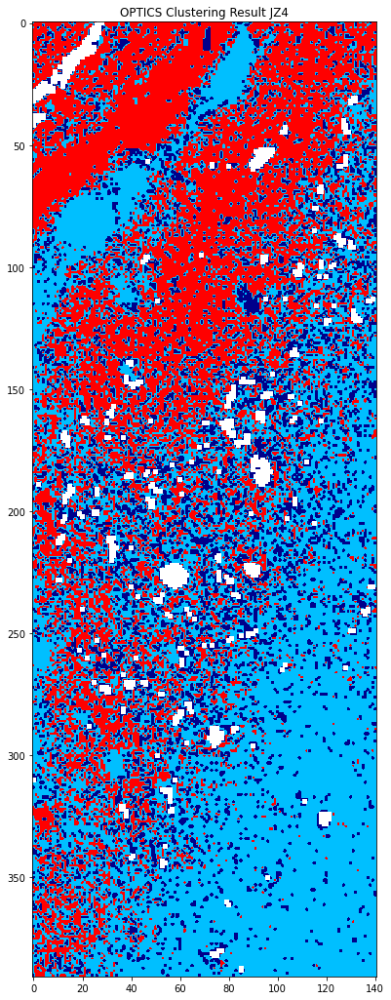

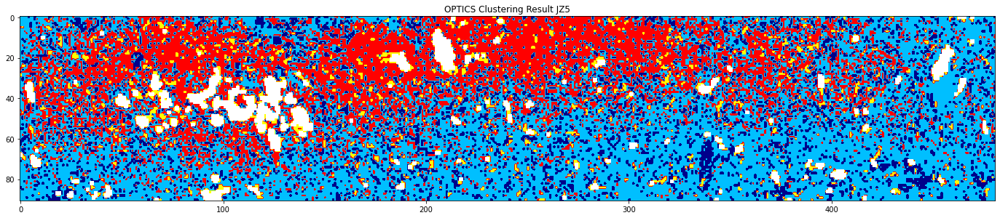

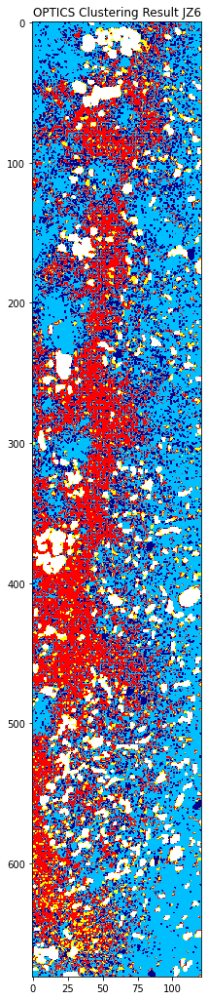

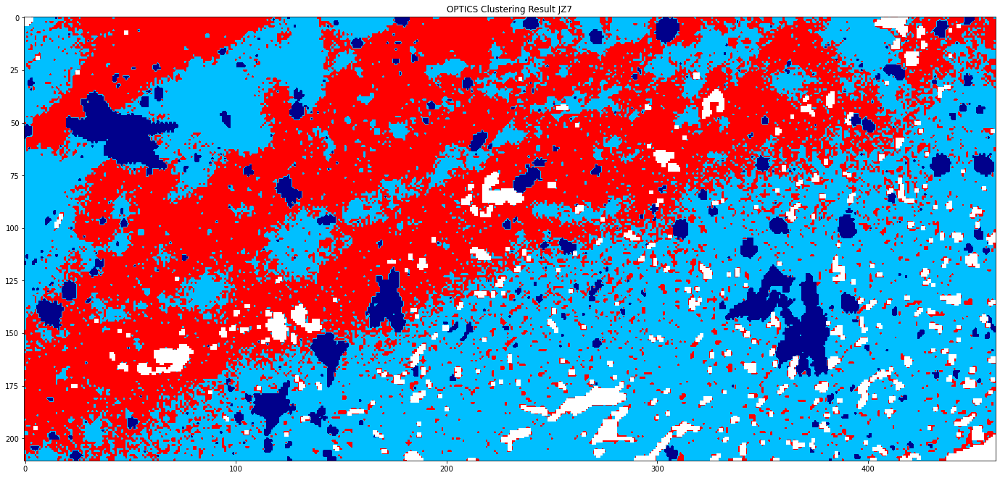

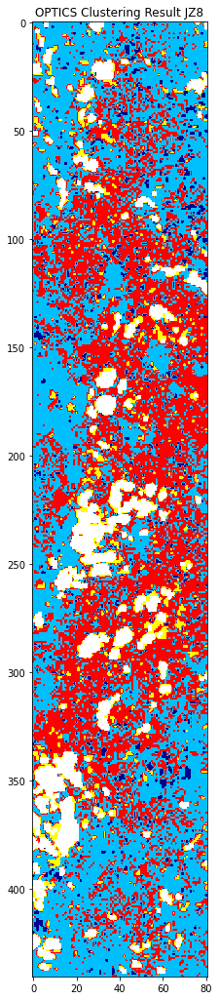

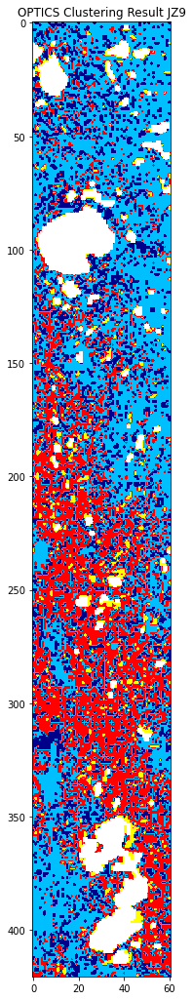

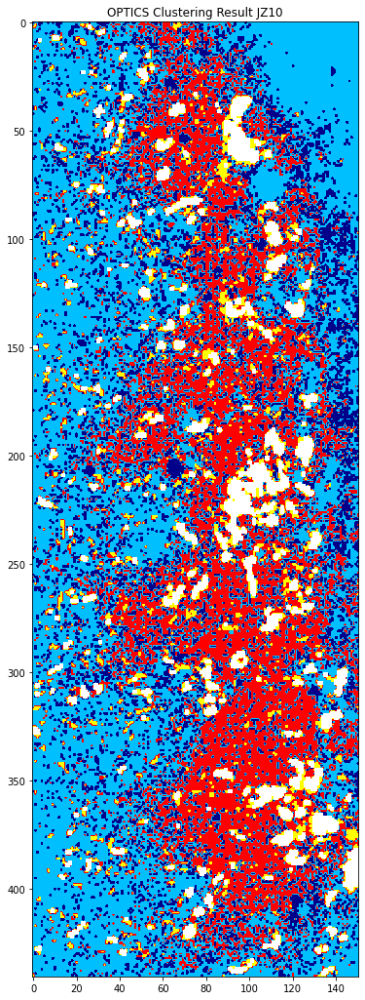

In [13]:
from matplotlib.colors import ListedColormap

color_map = {
    -1: 'darkblue',  
    0: 'deepskyblue',      
    1: 'red',        
    2: 'yellow',     
}

cluster_colors = [color_map[label] for label in sorted(color_map.keys())]
custom_cmap = ListedColormap(cluster_colors)

for i in np.arange(len(flattened_data)):
    plt.figure(figsize=(24, 18))
    plt.imshow(cluster_reshaped[i], cmap=custom_cmap, vmin=-1, vmax=2)
    plt.title(f"OPTICS Clustering Result JZ{i+1}")
    #plt.savefig(f'optics_clustering_JZ{i+1}.svg', format='svg')
    plt.show()

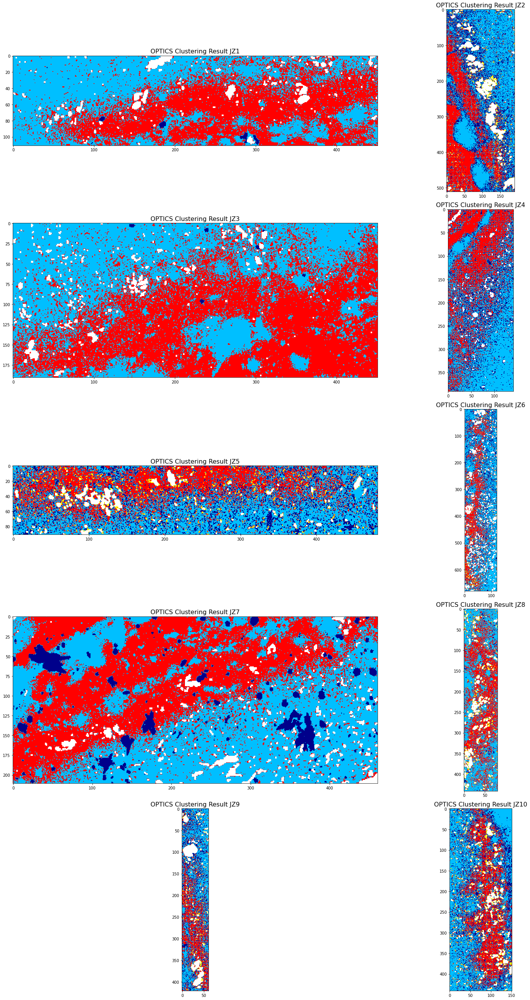

In [14]:
from matplotlib.colors import ListedColormap

color_map = {
    -1: 'darkblue',  
    0: 'deepskyblue',      
    1: 'red',        
    2: 'yellow',     
}

cluster_colors = [color_map[label] for label in sorted(color_map.keys())]
custom_cmap = ListedColormap(cluster_colors)

n_datasets = len(flattened_data)

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(24, 36))
axes = axes.flatten()

for i in range(n_datasets):
    ax = axes[i]
    im = ax.imshow(cluster_reshaped[i], cmap=custom_cmap, vmin=-1, vmax=2) 
    ax.set_title(f"OPTICS Clustering Result JZ{i+1}", fontsize=16)

for j in range(n_datasets, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

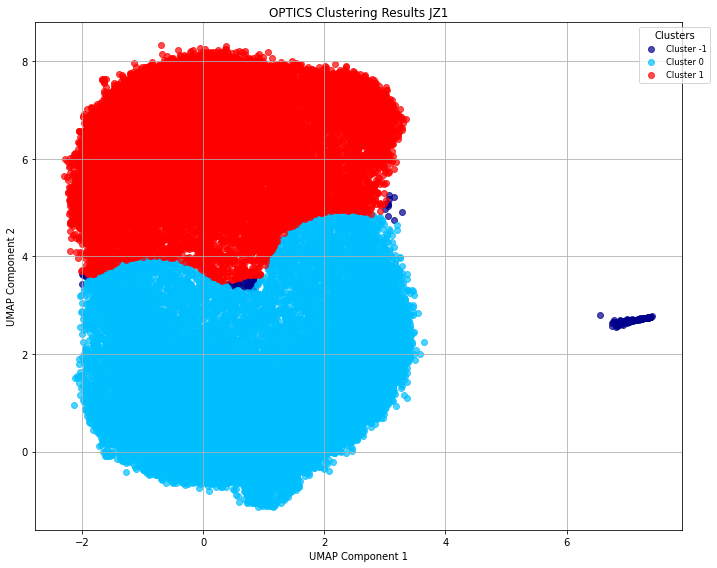

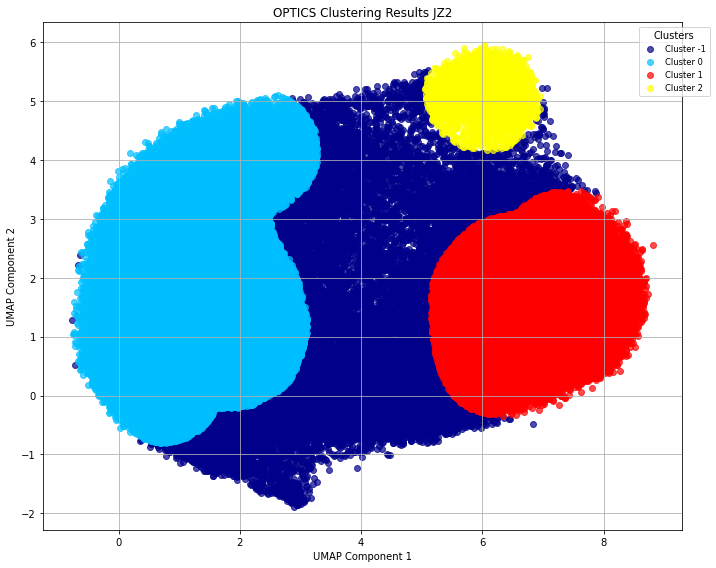

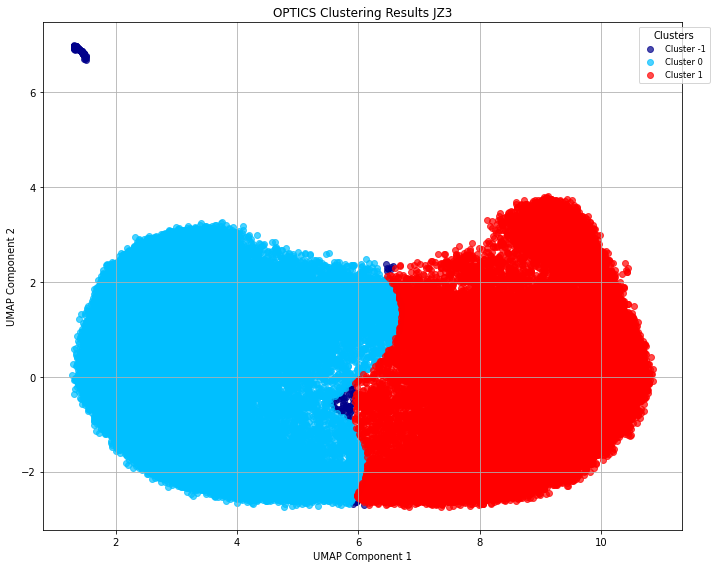

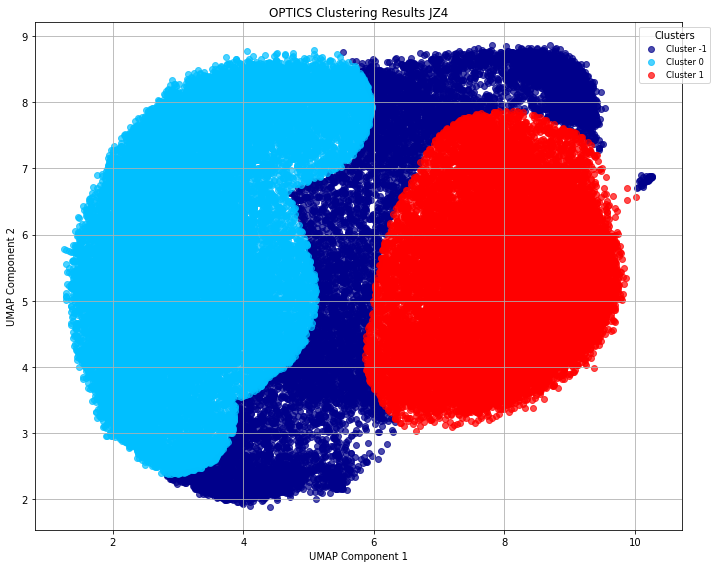

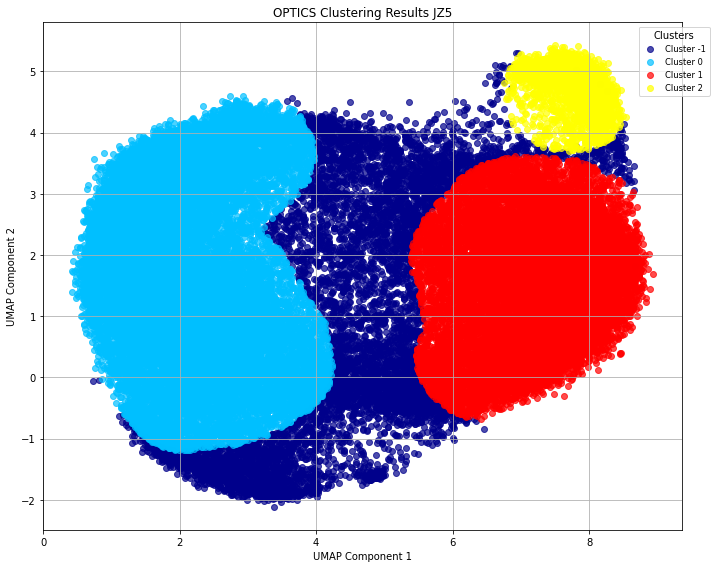

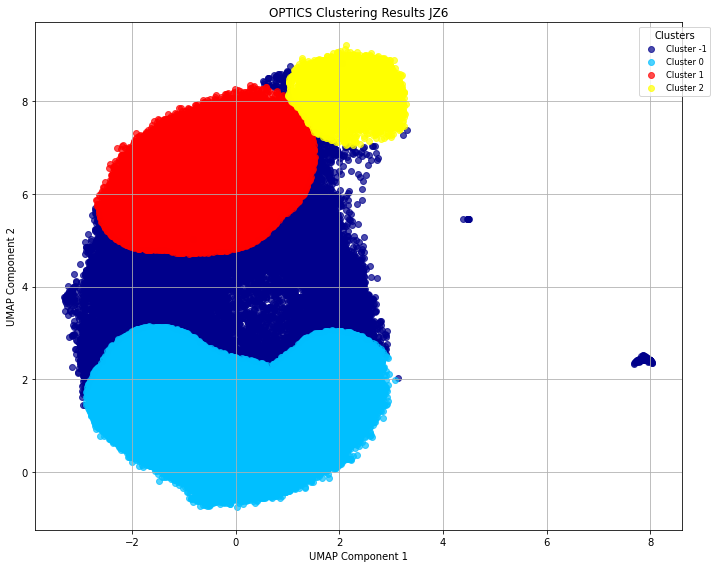

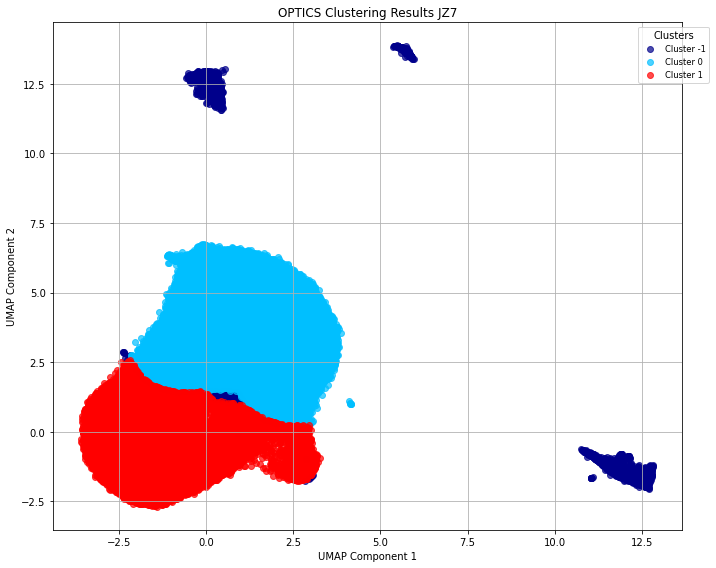

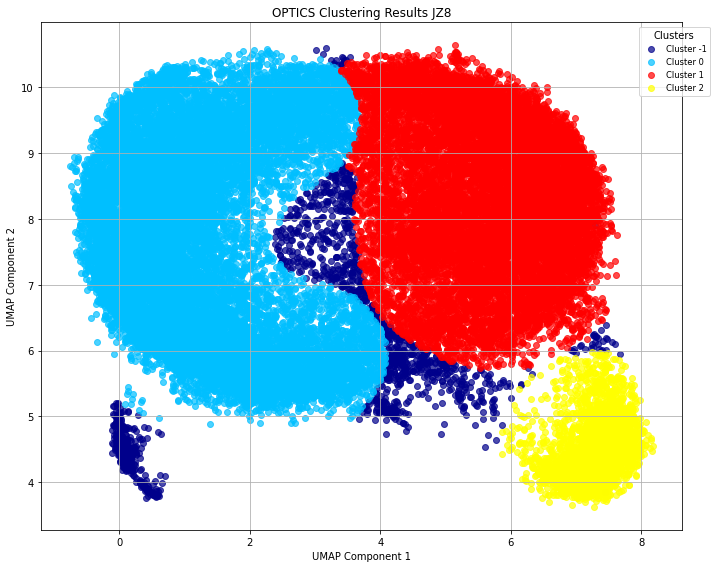

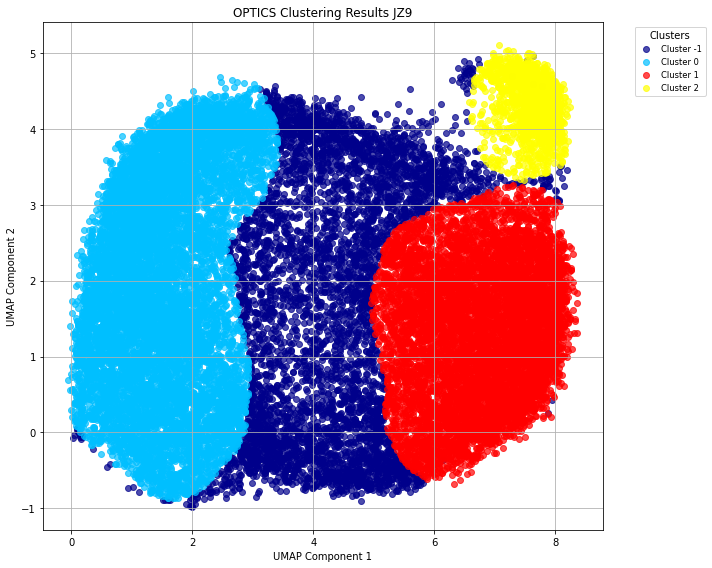

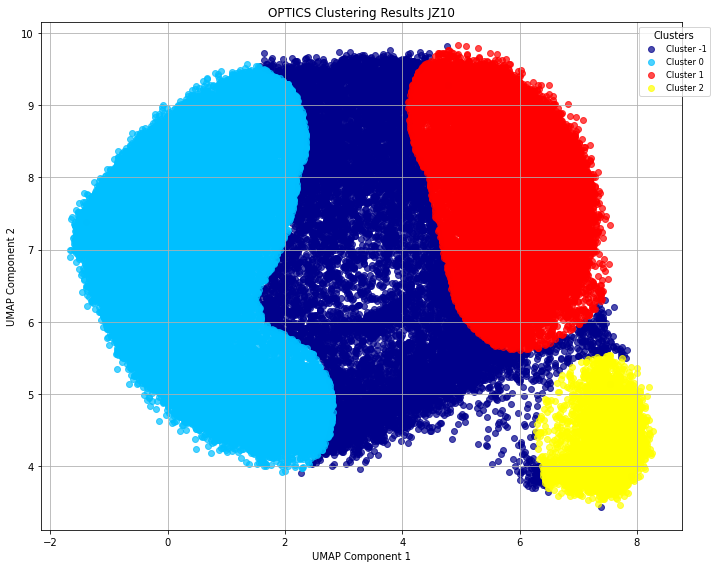

In [20]:
color_map = {
    -1: 'darkblue', 
    0: 'deepskyblue',   
    1: 'red',        
    2: 'yellow',     
}

n_datasets = len(flattened_data)

for i in np.arange(n_datasets):
    plt.figure(figsize=(10, 8))
    unique_labels = np.unique(labels[i])    
    
    for idx, label in enumerate(unique_labels):
        color = color_map.get(label, 'gray')
        marker = 'o' 
        label_name = f'Cluster {label}'
        
        mask = labels[i] == label
        plt.scatter(umap_results[i][mask, 0], umap_results[i][mask, 1], c=[color], label=label_name, marker=marker, alpha=0.7,)
        
    plt.title(f"OPTICS Clustering Results JZ{i+1}")
    plt.xlabel("UMAP Component 1")
    plt.ylabel("UMAP Component 2")
    plt.legend(loc='best', title="Clusters", bbox_to_anchor=(1.05, 1), fontsize='small')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

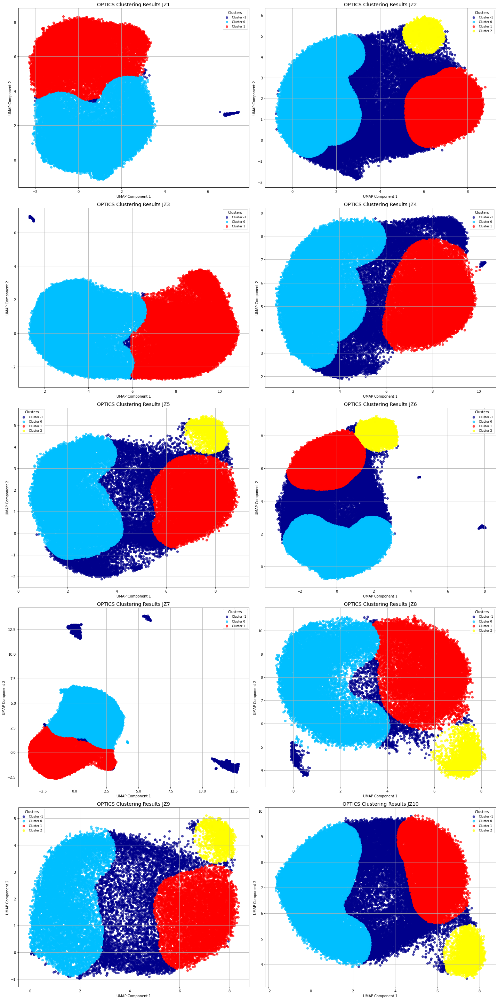

In [11]:
color_map = {
    -1: 'darkblue', 
    0: 'deepskyblue',   
    1: 'red',        
    2: 'yellow',     
}

n_datasets = len(flattened_data)

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(20, 40))
axes = axes.flatten()

for i in range(n_datasets):
    ax = axes[i]
    unique_labels = np.unique(labels[i])

    for label in unique_labels:
        color = color_map.get(label, 'gray')
        mask = labels[i] == label
        ax.scatter(
            umap_results[i][mask, 0],
            umap_results[i][mask, 1],
            c=[color],
            label=f'Cluster {label}',
            marker='o',
            alpha=0.7,
        )

    ax.set_title(f"OPTICS Clustering Results JZ{i+1}", fontsize=14)
    ax.set_xlabel("UMAP Component 1")
    ax.set_ylabel("UMAP Component 2")
    ax.legend(loc='best', title="Clusters", fontsize='small')
    ax.grid(True)

# Turn off unused axes
for j in range(n_datasets, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

# Cluster Comparison

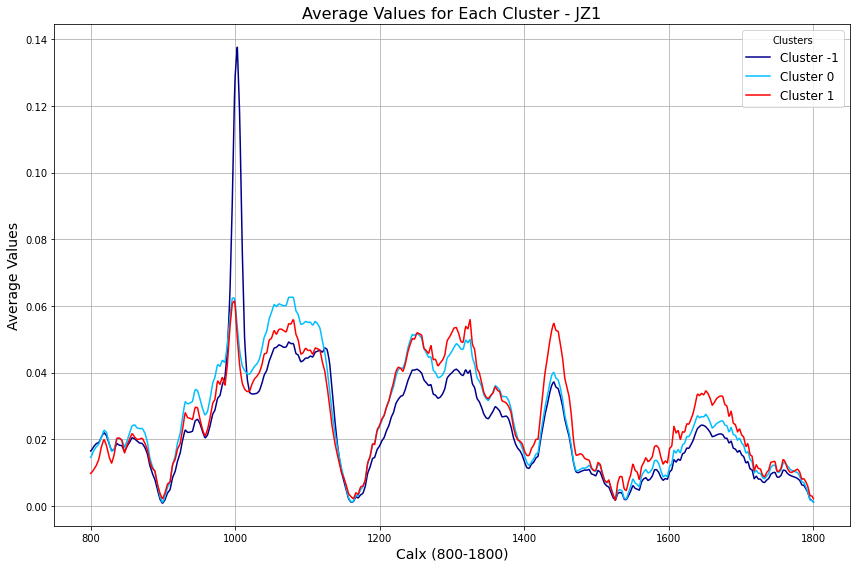

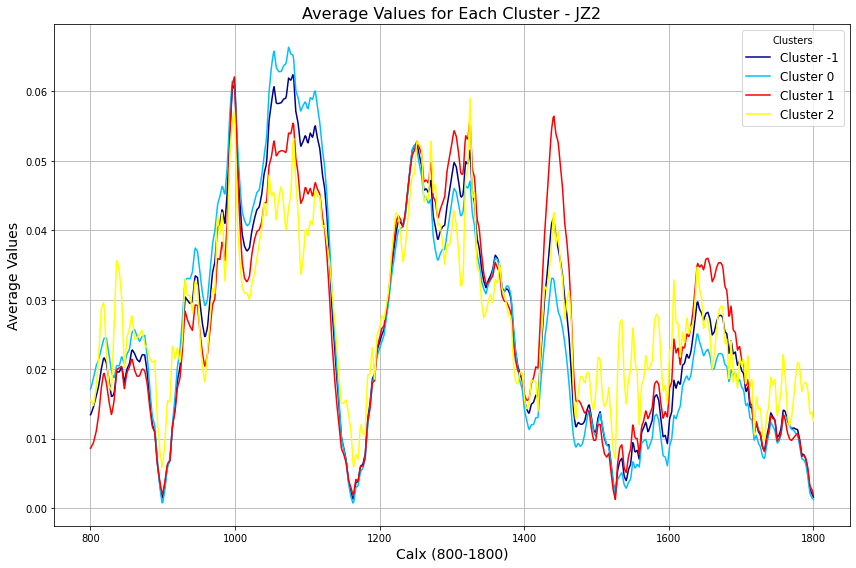

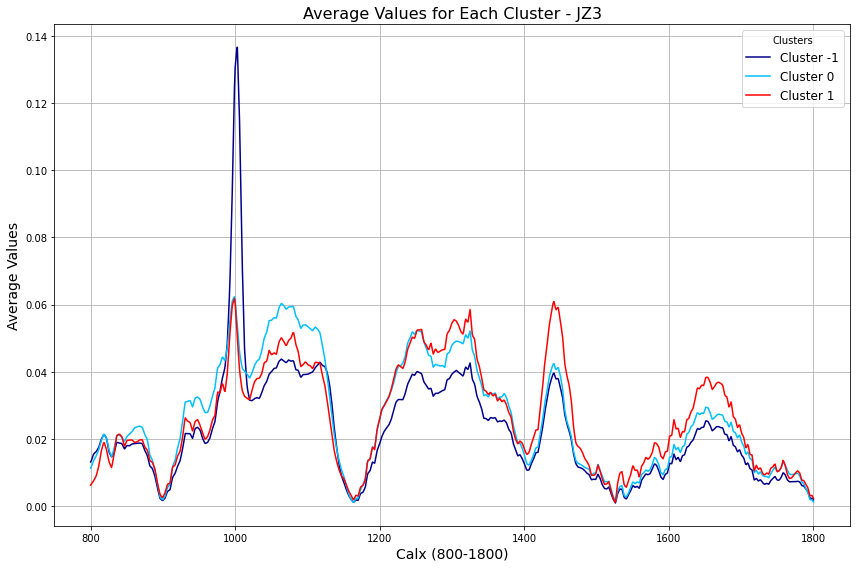

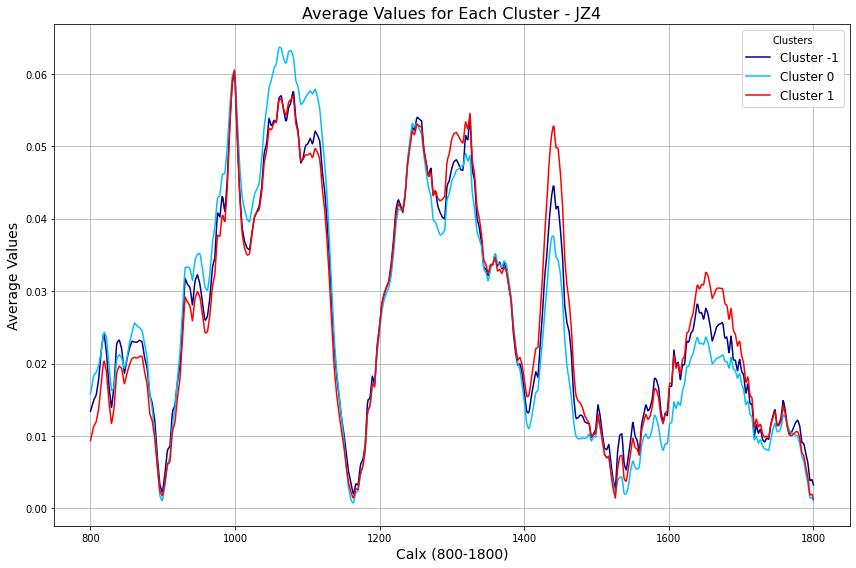

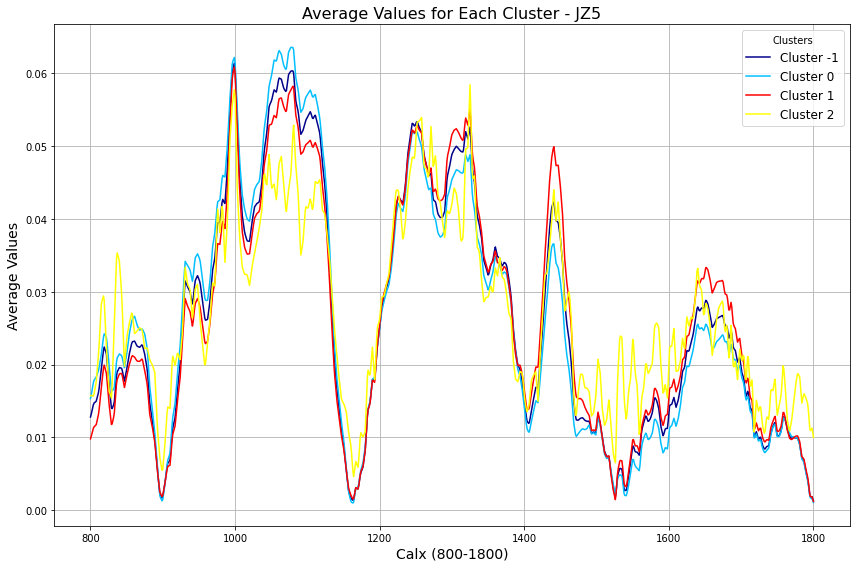

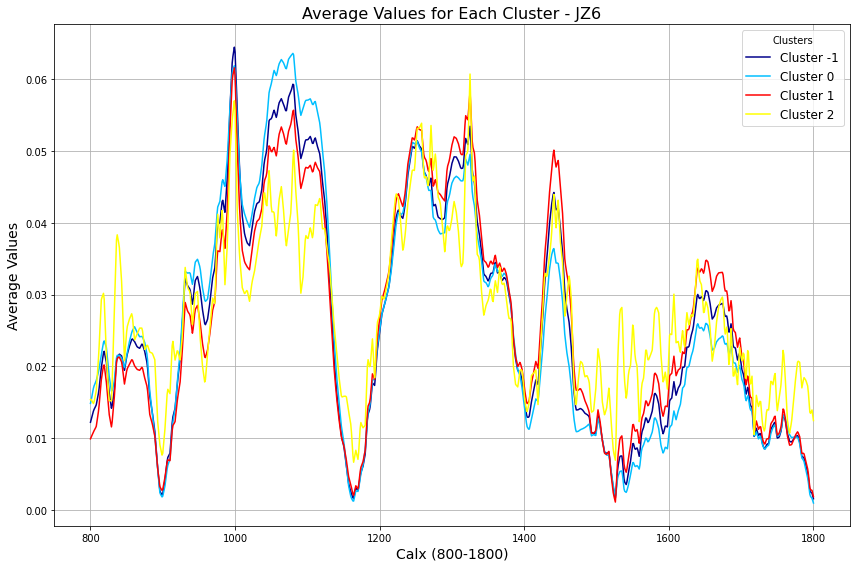

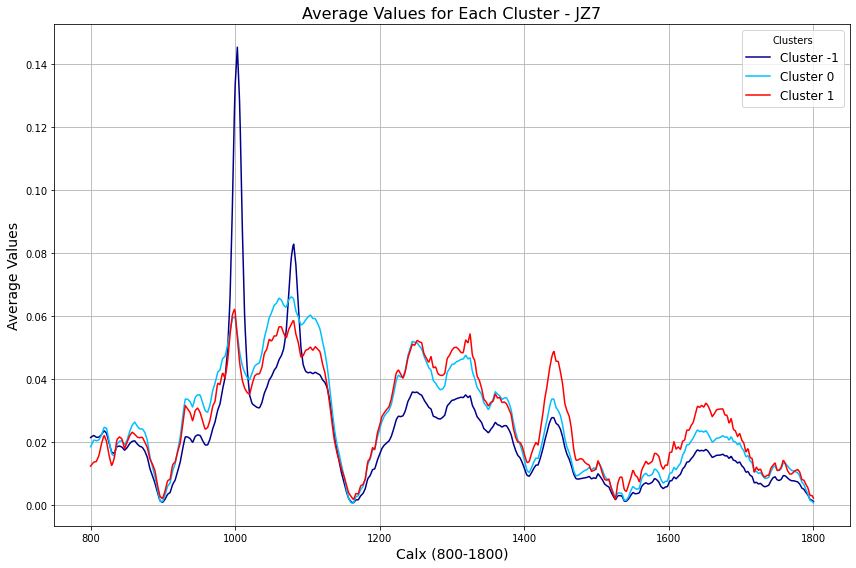

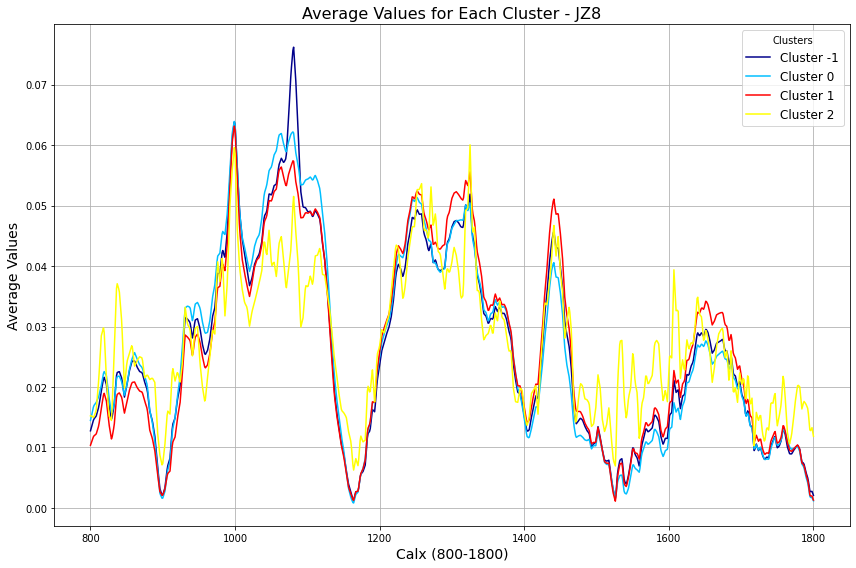

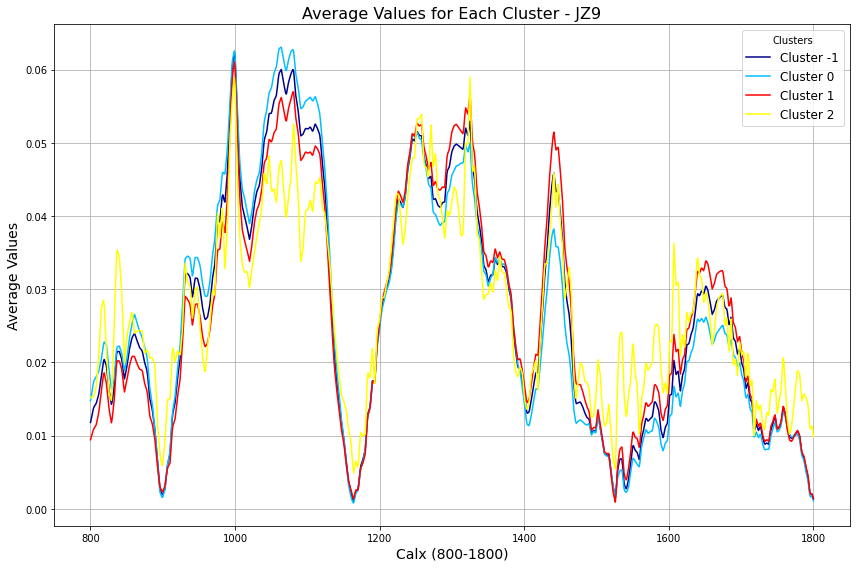

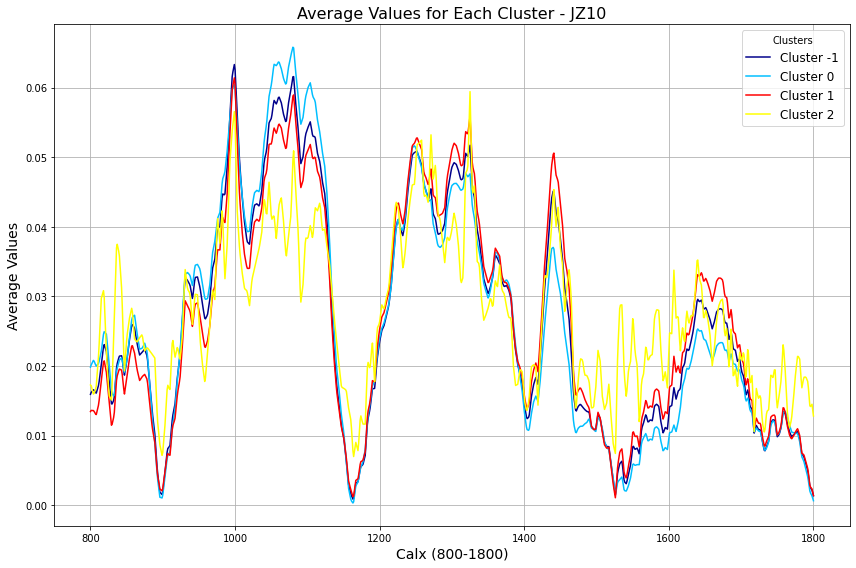

In [28]:
color_map = {
    -1: 'darkblue',  # Noise
    0: 'deepskyblue',      # Cluster 0
    1: 'red',        # Cluster 1
    2: 'yellow',     # Cluster 2
}

all_cluster_averages = []
for i in np.arange(len(flattened_data)):
    cluster_averages = {}
    unique_clusters = np.unique(cluster_reshaped[i])
    unique_clusters = unique_clusters[~np.isnan(unique_clusters)]
    
    for cluster in unique_clusters:
        cluster_mask = cluster_reshaped[i] == cluster
        cluster_data = reshaped_data[i][cluster_mask]
        cluster_average = np.mean(cluster_data, axis=0)
        cluster_averages[int(cluster)] = cluster_average
    
    all_cluster_averages.append(cluster_averages)
    plt.figure(figsize=(12, 8))

    for idx, (cluster, avg_values) in enumerate(cluster_averages.items()):
        color = color_map.get(cluster, 'gray')
        plt.plot(calx, avg_values, label=f"Cluster {cluster}", color=color)
        #np.savetxt(f"avg_spectra_JZ{i+1}_cluster_{cluster}.txt", avg_values)
        
    plt.title(f"Average Values for Each Cluster - JZ{i+1}", fontsize=16)
    plt.xlabel("Calx (800-1800)", fontsize=14)
    plt.ylabel("Average Values", fontsize=14)
    plt.legend(title="Clusters", fontsize=12)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

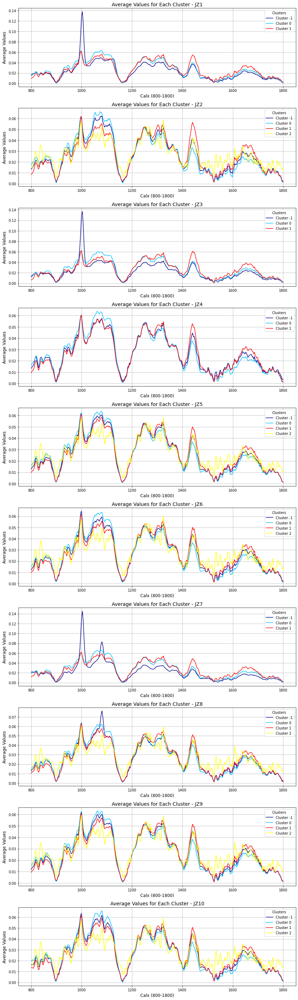

In [40]:
color_map = {
    -1: 'darkblue',  # Noise
    0: 'deepskyblue',      # Cluster 0
    1: 'red',        # Cluster 1
    2: 'yellow',     # Cluster 2
}

num_datasets = len(flattened_data)
fig, axes = plt.subplots(nrows=num_datasets, figsize=(12, 4 * num_datasets))

for i in np.arange(num_datasets):
    cluster_averages = {}

    unique_clusters = np.unique(cluster_reshaped[i])
    unique_clusters = unique_clusters[~np.isnan(unique_clusters)]  # Exclude NaN clusters

    for cluster in unique_clusters:
        cluster_mask = cluster_reshaped[i] == cluster
        cluster_data = reshaped_data[i][cluster_mask]
        cluster_average = np.mean(cluster_data, axis=0)
        cluster_averages[int(cluster)] = cluster_average

    ax = axes[i] if num_datasets > 1 else axes
    for cluster, avg_values in cluster_averages.items():
        color = color_map.get(cluster, 'gray')  # Default to gray if label is unexpected
        ax.plot(
            calx,
            avg_values,
            label=f"Cluster {int(cluster)}",
            color=color,
        )

    ax.set_title(f"Average Values for Each Cluster - JZ{i+1}", fontsize=14)
    ax.set_xlabel("Calx (800-1800)", fontsize=12)
    ax.set_ylabel("Average Values", fontsize=12)
    ax.legend(title="Clusters", fontsize=10)
    ax.grid(True)

plt.tight_layout()
plt.show()

In [21]:
cluster_color = 'red'

num_datasets = len(flattened_data)

cluster_1_first_5 = np.concatenate([reshaped_data[0][cluster_reshaped[0]==1],reshaped_data[1][cluster_reshaped[1]==1],
                                   reshaped_data[2][cluster_reshaped[2]==1],reshaped_data[3][cluster_reshaped[3]==1],
                                   reshaped_data[4][cluster_reshaped[4]==1]])
cluster_1_second_5 = np.concatenate([reshaped_data[5][cluster_reshaped[5]==1],reshaped_data[6][cluster_reshaped[6]==1],
                                   reshaped_data[7][cluster_reshaped[7]==1],reshaped_data[8][cluster_reshaped[8]==1],
                                   reshaped_data[9][cluster_reshaped[9]==1]])

# Mean and Standard deviation for all the tissue pixels for Control Group and In Vitro Fertilization

In [22]:
# Control Group
cluster_1_first_5_mean=np.mean(cluster_1_first_5,axis=0)
cluster_1_first_5_std=np.std(cluster_1_first_5,axis=0)
# In vitro fertilization
cluster_1_second_5_mean=np.mean(cluster_1_second_5,axis=0)
cluster_1_second_5_std=np.std(cluster_1_second_5,axis=0)

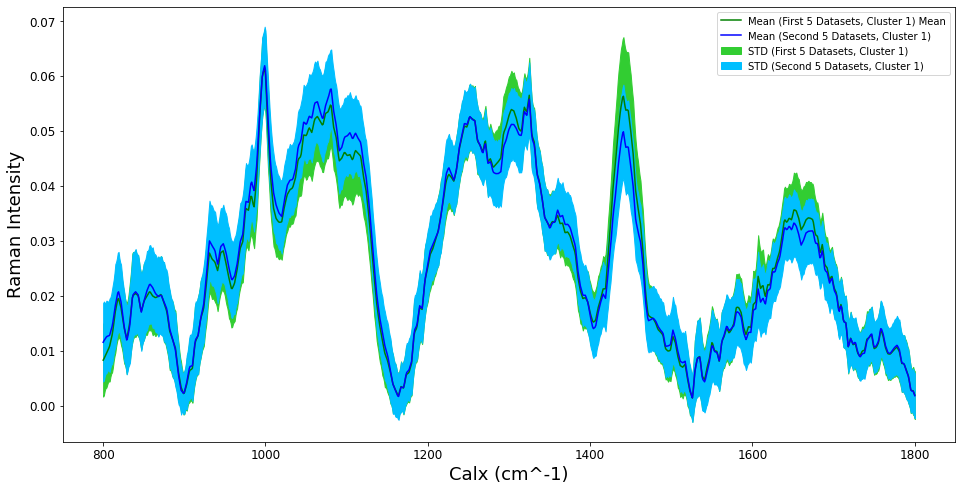

In [31]:
plt.figure(figsize=(16, 8))
plt.plot(calx,cluster_1_first_5_mean,'g',label='Mean (First 5 Datasets, Cluster 1) Mean')
plt.plot(calx,cluster_1_second_5_mean,'b',label='Mean (Second 5 Datasets, Cluster 1)')
plt.fill_between(calx, cluster_1_first_5_mean - cluster_1_first_5_std, cluster_1_first_5_mean + cluster_1_first_5_std, color='limegreen',label='STD (First 5 Datasets, Cluster 1)')
plt.fill_between(calx, cluster_1_second_5_mean - cluster_1_second_5_std, cluster_1_second_5_mean + cluster_1_second_5_std, color='deepskyblue',label='STD (Second 5 Datasets, Cluster 1)')
plt.xlabel('Calx (cm^-1)',fontsize=18)
plt.ylabel('Raman Intensity',fontsize=18)

plt.tick_params(axis='both', labelsize=12)
plt.legend(fontsize=10)
plt.savefig('cluster1meanstd.svg', format='svg')
plt.show()

# Asymptotic Two-Sided Bonferroni Corrected Mann Whitney U-Test 

In [34]:
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

n_wavenumbers = 1001

p_values = []

for i in range(n_wavenumbers):
    first_5_wavenumber = cluster_1_first_5[:, i]
    second_5_wavenumber = cluster_1_second_5[:, i]
    
    # Perform Mann-Whitney U test
    stat, p_value = mannwhitneyu(first_5_wavenumber, second_5_wavenumber, alternative='two-sided', method='asymptotic')    
    # Append the p-value to the list
    p_values.append(p_value)

In [39]:
p_values = np.array(p_values)

adjusted_p_values = multipletests(p_values, alpha=0.01, method='bonferroni')

# Extract the corrected p-values and the boolean array of significant results
corrected_p_values = adjusted_p_values[1]
significant_wavenumbers = np.where(adjusted_p_values[0])[0]

In [57]:
np.savetxt('adjusted_p_values[0].txt', adjusted_p_values[0])

In [62]:
np.savetxt('p_values.txt', p_values)

In [79]:
JZ2_cluster1 = reshaped_data[1][cluster_reshaped[1]==1]

In [77]:
JZ2_cluster1

array([[ 3.6899e-02,  3.9104e-02,  3.9941e-02, ...,  2.2178e-03,
         1.1373e-03,  4.7931e-05],
       [ 2.6449e-02,  2.5950e-02,  2.8261e-02, ...,  5.3720e-03,
         4.4304e-03,  3.4853e-03],
       [ 1.4563e-02,  1.5230e-02,  1.2882e-02, ...,  7.2158e-03,
         7.3034e-03,  7.3847e-03],
       ...,
       [ 1.5393e-02,  1.6557e-02,  1.6469e-02, ...,  1.6699e-03,
         6.9217e-04, -2.9330e-04],
       [ 1.1557e-02,  1.1689e-02,  1.1944e-02, ...,  6.8846e-03,
         7.5029e-03,  8.0774e-03],
       [ 5.0341e-03,  4.2093e-03,  5.0473e-03, ...,  4.9004e-03,
         1.7678e-03, -1.3727e-03]])

# AN EXTRA ATTEMPT

# Examining Subclusters of Cluster 1 in JZ2

In [27]:
mask = cluster_reshaped[1] == 1

updated_reshaped_data_1 = np.full_like(reshaped_data[1], np.nan, dtype=np.float64)

updated_reshaped_data_1[mask] = reshaped_data[1][mask]

num_non_nan = np.count_nonzero(~np.isnan(updated_reshaped_data_1))

print("Number of non-NaN values:", num_non_nan/1001)

Number of non-NaN values: 26466.0


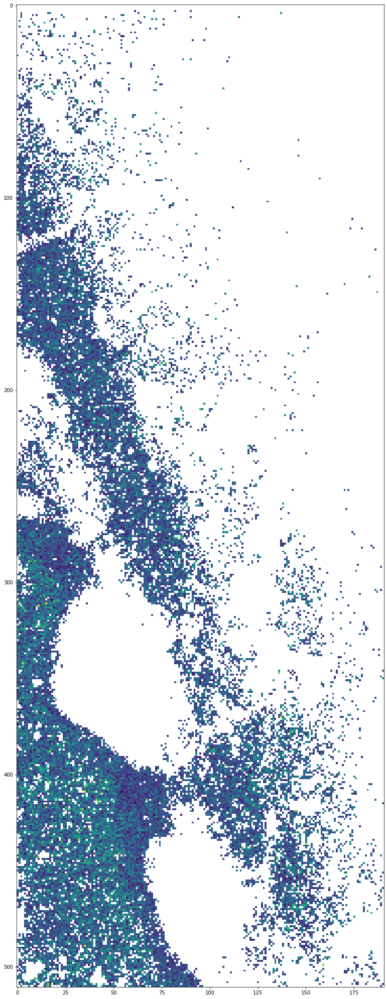

In [135]:
plt.figure(figsize=(72, 36))
plt.imshow(updated_reshaped_data_1[:,:,34])

In [34]:
n_samples_2 = updated_reshaped_data_1.shape[0]
n_features_2 = updated_reshaped_data_1.shape[1]
n_bands_2 = 1001

In [35]:
flattened_data_2 = updated_reshaped_data_1.reshape(-1,n_bands)
nan_mask_2 = np.isnan(flattened_data_2)
non_nan_data_2 = flattened_data_2[~nan_mask_2].reshape(-1,n_bands_2)
scaler = StandardScaler()
reshaped_data_scaled_2 = scaler.fit_transform(non_nan_data_2)

In [36]:
t0=time.time()

umap_model = umap.UMAP(metric="cosine", random_state=42, n_components=2, n_jobs=-1)
umap_result_JZ2 = umap_model.fit_transform(reshaped_data_scaled_2)
    
t1=time.time()
t1-t0

/home/root/anaconda3/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


35.35242414474487

In [37]:
umap_with_nans_2 = np.full((flattened_data_2.shape[0], 2), np.nan)
umap_valid_rows_2 = ~np.any(nan_mask_2, axis=1)
umap_with_nans_2[umap_valid_rows_2] = umap_result_JZ2
umap_reshaped_2 = umap_with_nans_2.reshape(n_samples_2, n_features_2, 2)

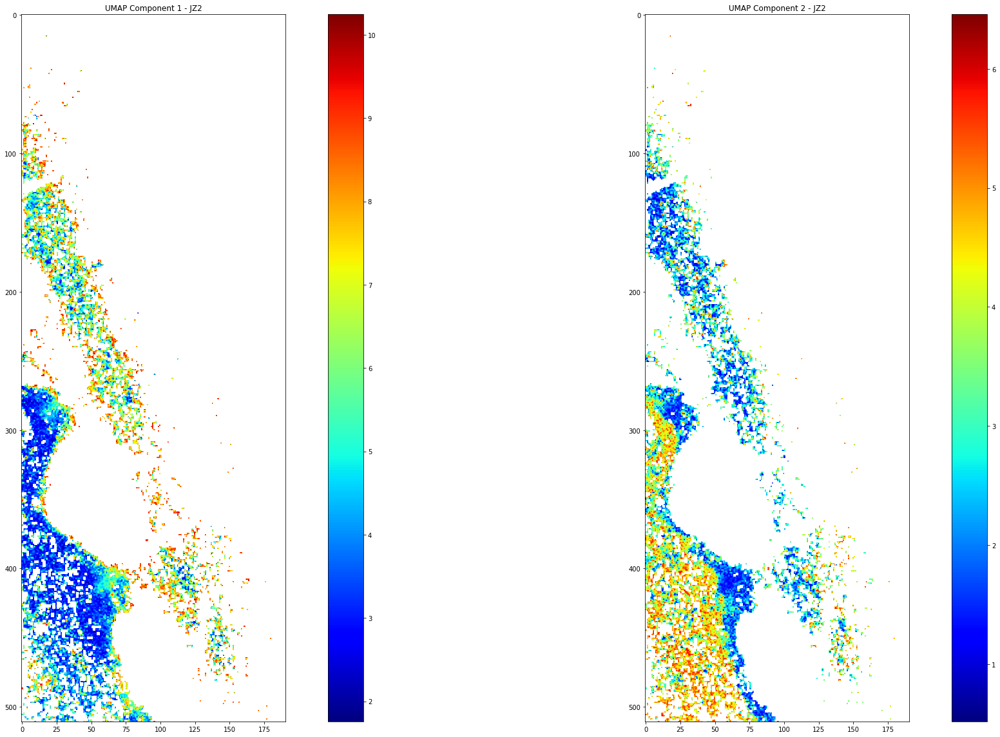

In [47]:
plt.figure(figsize=(32, 16))

plt.subplot(1, 2, 1)
plt.imshow(umap_reshaped_2[:, :, 0], cmap='jet')
plt.colorbar()
plt.title("UMAP Component 1 - JZ2")

plt.subplot(1, 2, 2)
plt.imshow(umap_reshaped_2[:, :, 1], cmap='jet')
plt.colorbar()
plt.title("UMAP Component 2 - JZ2")

plt.tight_layout()
plt.show()

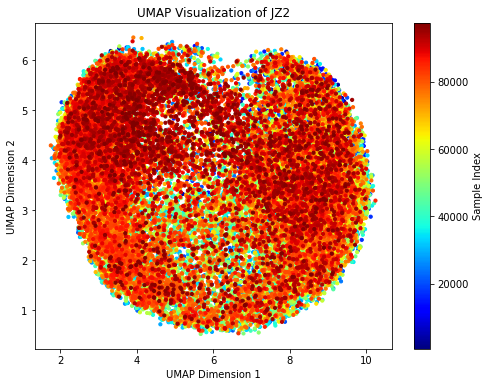

In [41]:
plt.figure(figsize=(8, 6))
plt.scatter(umap_with_nans_2[:, 0], umap_with_nans_2[:, 1], c=np.arange(n_samples_2*n_features_2), cmap='jet', s=10)
plt.colorbar(label='Sample Index')
plt.title("UMAP Visualization of JZ2")
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.show()

In [42]:
rows = 511
cols = 191
min_samples_2 = int(rows*cols/20)

In [43]:
eps_values_2 = np.arange(0.0, 2.0, 0.1)

def evaluate_optics(eps_2, umap_result_JZ2, min_samples_2):
    optics_2 = OPTICS(min_samples=min_samples_2, max_eps=eps_2, n_jobs=-1)
    clusters_2 = optics_2.fit(umap_result_JZ2)
    
    labels_2 = clusters_2.labels_
    n_clusters_2 = len(set(labels_2) - {-1})
    
    if n_clusters_2 > 1:
        score_2 = silhouette_score(umap_result_JZ2, labels_2, sample_size=min(len(umap_result_JZ2), int(rows * cols / 10)))
    else:
        score_2 = -1
    return score_2

In [45]:
t0=time.time()

silhouette_scores_2 = Parallel(n_jobs=-1)(delayed(evaluate_optics)(eps_2, umap_result_JZ2, min_samples_2) for eps_2 in eps_values_2)

t1=time.time()
print(t1-t0)
best_eps_2 = eps_values_2[np.argmax(silhouette_scores_2)]
best_eps_2

329.0354845523834


1.4000000000000001

In [48]:
silhouette_scores_2

[-1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 0.39597806,
 0.4195392,
 0.39545226,
 0.3721662,
 -1,
 -1,
 -1]

In [49]:
eps_values_new_2 = np.arange(best_eps_2 - 0.1, best_eps_2 + 0.1, 0.01)

In [50]:
t0=time.time()

silhouette_scores_new_2 = Parallel(n_jobs=-1)(delayed(evaluate_optics)(eps_2, umap_result_JZ2, min_samples_2) for eps_2 in eps_values_new_2)

t1=time.time()
print(t1-t0)
best_eps_new_2 = eps_values_new_2[np.argmax(silhouette_scores_new_2)]
best_eps_new_2

297.70587491989136


1.37

In [51]:
silhouette_scores_new_2

[0.39682898,
 0.40514365,
 0.40406218,
 0.41394603,
 0.41313305,
 0.41173887,
 0.41484872,
 0.4225551,
 0.41579467,
 0.42010507,
 0.41852266,
 0.41549253,
 0.41605136,
 0.40782836,
 0.403547,
 0.40180153,
 0.40021193,
 0.39237767,
 0.39675343,
 0.39445847,
 0.3941943]

In [52]:
t0=time.time()
optics_2 = OPTICS(min_samples=min_samples_2, max_eps=best_eps_new_2, n_jobs=-1)
clusters_new_2 = optics_2.fit(umap_result_JZ2)

labels_2 = optics_2.labels_
t1=time.time()
t1-t0

84.9732575416565

In [53]:
clusters_new_2.labels_.shape

(26466,)

In [54]:
cluster_with_nans_2 = np.full((flattened_data_2.shape[0]), np.nan)
cluster_valid_rows_2 = ~np.any(nan_mask_2, axis=1)
cluster_with_nans_2[umap_valid_rows_2] = clusters_new_2.labels_

In [55]:
cluster_with_nans_reshaped_2 = cluster_with_nans_2.reshape(rows,cols)

In [67]:
np.savetxt('optics_clustering_JZ2_cl1.txt', cluster_with_nans_reshaped_2)

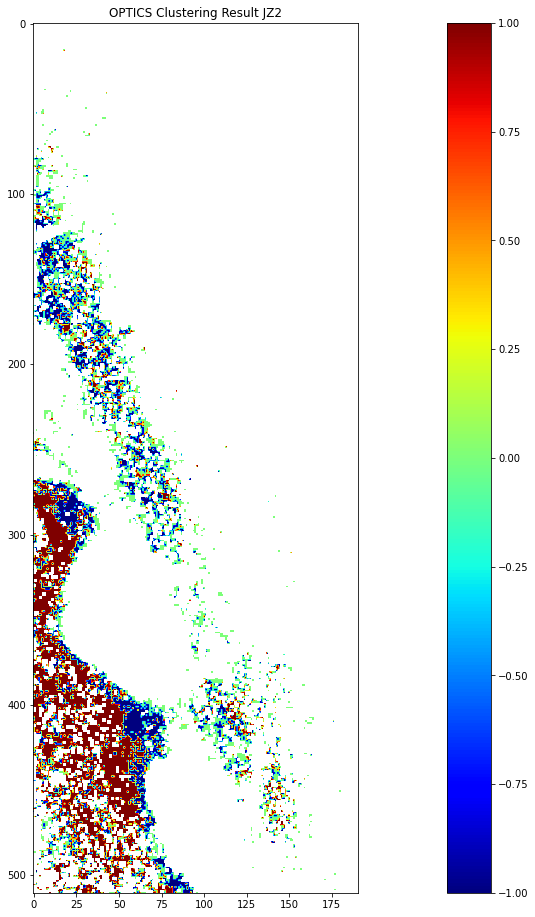

In [65]:
plt.figure(figsize=(32, 16))
plt.imshow(cluster_with_nans_reshaped_2, cmap='jet')
plt.colorbar()
plt.title("OPTICS Clustering Result JZ2")
#plt.savefig('optics_clustering_JZ2_cl1.svg', format='svg')
plt.show()

# The red cluster above may belong to the mother. In this situation one may need to extract the red part.

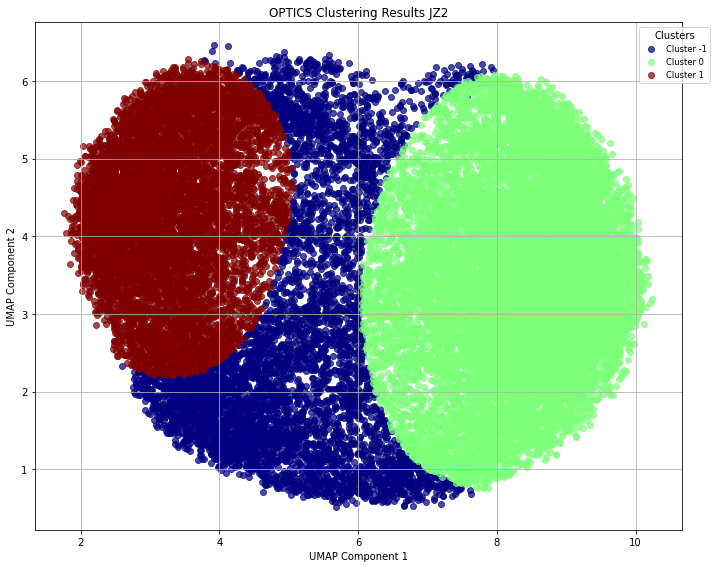

In [68]:
plt.figure(figsize=(10, 8))
unique_labels_2 = np.unique(labels_2)

colormap_2 = plt.cm.jet
colors_2 = colormap_2(np.linspace(0, 1, len(unique_labels_2)))

for idx, label in enumerate(unique_labels_2):
    color_2 = colors_2[idx]  
    marker_2 = 'o' 
    label_name_2 = f'Cluster {label}'
    
    mask_2 = labels_2 == label
    plt.scatter(
        umap_result_JZ2[mask_2, 0],
        umap_result_JZ2[mask_2, 1],
        c=[color_2],  
        label=label_name_2,
        marker=marker_2,
        alpha=0.7,
    )

plt.title("OPTICS Clustering Results JZ2")
plt.xlabel("UMAP Component 1")
plt.ylabel("UMAP Component 2")
plt.legend(loc='best', title="Clusters", bbox_to_anchor=(1.05, 1), fontsize='small')
plt.grid(True)
plt.tight_layout()

#plt.savefig('optics_clusters_JZ2_cl1.svg', format='svg')
plt.show()

In [70]:
cluster_averages_2.items()

dict_items([(-1, array([0.00679524, 0.00697267, 0.00719408, ..., 0.0022417 , 0.00186156,
       0.0014755 ])), (0, array([0.01004879, 0.01025489, 0.0105366 , ..., 0.00192667, 0.00161864,
       0.00130411])), (1, array([0.00750765, 0.0075627 , 0.00762037, ..., 0.00419333, 0.0036464 ,
       0.00309424]))])

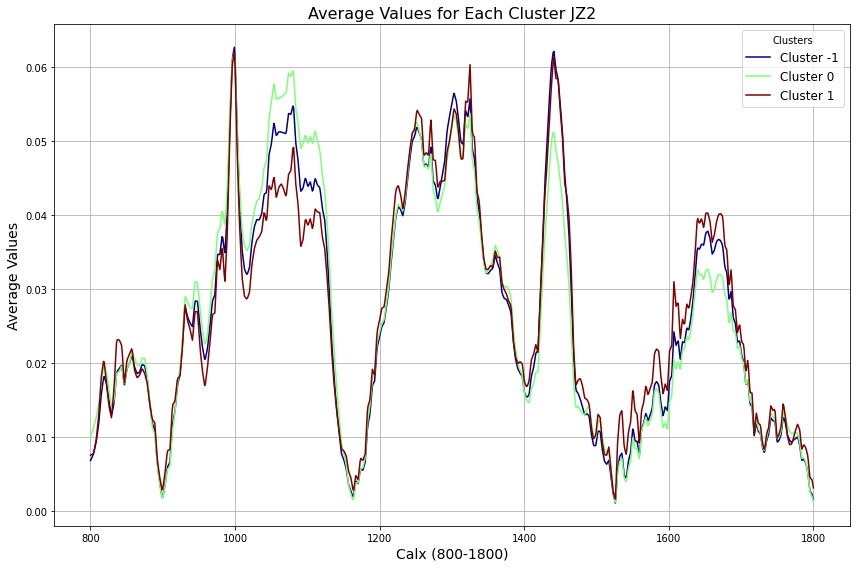

In [80]:
cluster_averages_2 = {}

unique_clusters_2 = np.unique(cluster_with_nans_reshaped_2)
unique_clusters_2 = unique_clusters_2[~np.isnan(unique_clusters_2)]

for cluster_2 in unique_clusters_2:
    cluster_mask_2 = cluster_with_nans_reshaped_2 == cluster_2
    
    cluster_data_2 = reshaped_data[1][cluster_mask_2]
    
    cluster_average_2 = np.mean(cluster_data_2, axis=0)  # Shape: (1001,)
    
    cluster_averages_2[int(cluster_2)] = cluster_average_2

plt.figure(figsize=(12, 8))

colormap_2 = plt.cm.jet
colors_2 = colormap_2(np.linspace(0, 1, len(unique_clusters_2)))

for idx_2, (cluster_2, avg_values_2) in enumerate(cluster_averages_2.items()):
    plt.plot(calx, avg_values_2, label=f"Cluster {cluster_2}", color=colors_2[idx_2])
    #np.savetxt(f"avg_cluster_{cluster_2}_JZ2_cl1.txt", avg_values_2)
    
plt.title("Average Values for Each Cluster JZ2", fontsize=16)
plt.xlabel("Calx (800-1800)", fontsize=14)
plt.ylabel("Average Values", fontsize=14)
plt.legend(title="Clusters", fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

In [83]:
cluster_reshaped_2 = cluster_with_nans_2.reshape(n_samples_2, n_features_2)

In [129]:
np.count_nonzero(cluster_with_nans_reshaped_2==1)

7841

In [136]:
mask_2 = cluster_reshaped_2 == 1

updated_reshaped_data_2 = np.copy(reshaped_data[1])
updated_reshaped_data_2[mask_2] = np.nan
print("Number of non-NaN values remaining:", np.count_nonzero(np.isnan(updated_reshaped_data_2))/1001)

Number of non-NaN values remaining: 13158.0


In [137]:
flattened_data_2_2 = updated_reshaped_data_2.reshape(-1,n_bands_2)
nan_mask_2_2 = np.isnan(flattened_data_2_2)
non_nan_data_2_2 = flattened_data_2_2[~nan_mask_2_2].reshape(-1,n_bands_2)
scaler = StandardScaler()
reshaped_data_scaled_2_2 = scaler.fit_transform(non_nan_data_2_2)

In [141]:
t0=time.time()

umap_model = umap.UMAP(metric="cosine", random_state=42, n_components=2, n_jobs=-1)
umap_result_JZ2_2 = umap_model.fit_transform(reshaped_data_scaled_2_2)
    
t1=time.time()
t1-t0

/home/root/anaconda3/lib/python3.8/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


87.35511326789856

In [142]:
umap_with_nans_2_2 = np.full((flattened_data_2_2.shape[0], 2), np.nan)
umap_valid_rows_2_2 = ~np.any(nan_mask_2_2, axis=1)
umap_with_nans_2_2[umap_valid_rows_2_2] = umap_result_JZ2_2
umap_reshaped_2_2 = umap_with_nans_2_2.reshape(n_samples_2, n_features_2, 2)

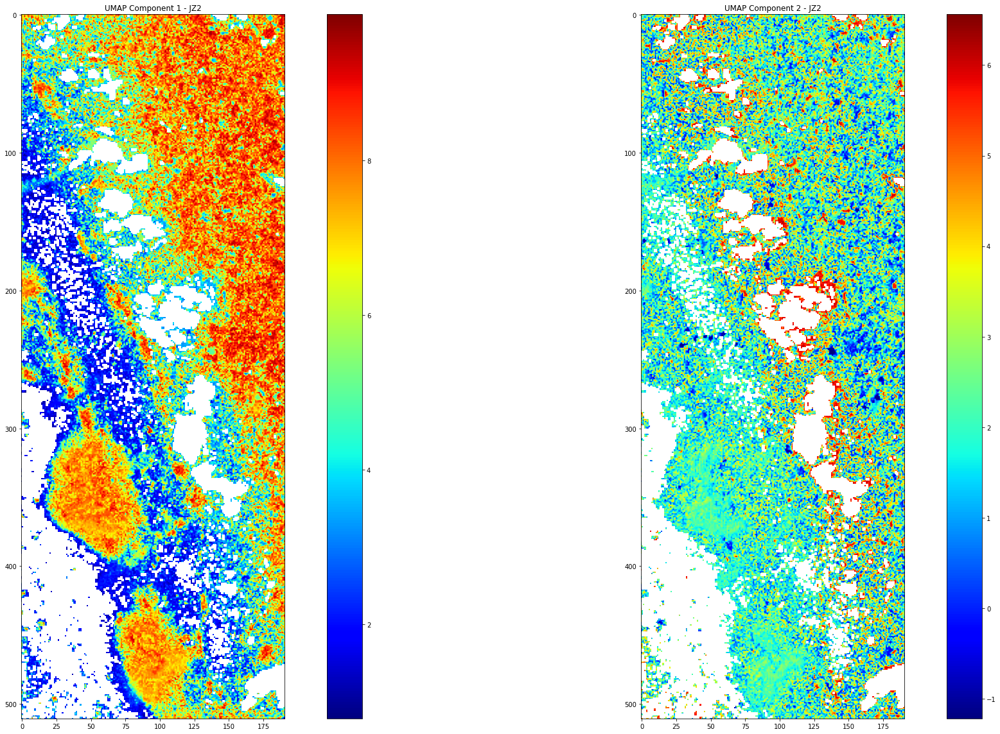

In [143]:
plt.figure(figsize=(32, 16))

plt.subplot(1, 2, 1)
plt.imshow(umap_reshaped_2_2[:, :, 0], cmap='jet')
plt.colorbar()
plt.title("UMAP Component 1 - JZ2")

plt.subplot(1, 2, 2)
plt.imshow(umap_reshaped_2_2[:, :, 1], cmap='jet')
plt.colorbar()
plt.title("UMAP Component 2 - JZ2")

plt.tight_layout()
plt.show()

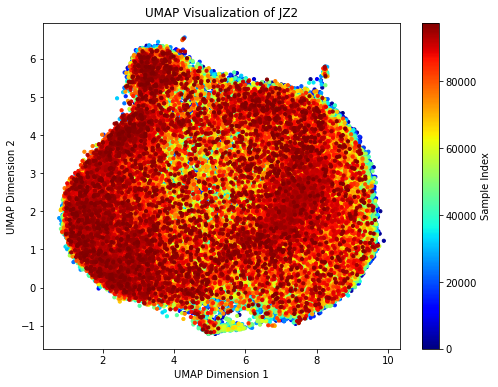

In [144]:
plt.figure(figsize=(8, 6))
plt.scatter(umap_with_nans_2_2[:, 0], umap_with_nans_2_2[:, 1], c=np.arange(n_samples_2*n_features_2), cmap='jet', s=10)
plt.colorbar(label='Sample Index')
plt.title("UMAP Visualization of JZ2")
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.show()

In [145]:
def evaluate_optics(eps_2, umap_result_JZ2_2, min_samples_2):
    optics_2_2 = OPTICS(min_samples=min_samples_2, max_eps=eps_2, n_jobs=-1)
    clusters_2_2 = optics_2_2.fit(umap_result_JZ2_2)
    
    labels_2_2 = clusters_2_2.labels_
    n_clusters_2_2 = len(set(labels_2_2) - {-1})
    
    if n_clusters_2_2 > 1:
        score_2_2 = silhouette_score(umap_result_JZ2_2, labels_2_2, sample_size=min(len(umap_result_JZ2_2), int(rows * cols / 10)))
    else:
        score_2_2 = -1
    return score_2_2

In [146]:
t0=time.time()

silhouette_scores_2_2 = Parallel(n_jobs=-1)(delayed(evaluate_optics)(eps_2, umap_result_JZ2_2, min_samples_2) for eps_2 in eps_values_2)

t1=time.time()
print(t1-t0)
best_eps_2_2 = eps_values_2[np.argmax(silhouette_scores_2_2)]
best_eps_2_2

1542.9875087738037


0.9

In [160]:
silhouette_scores_2_2

[-1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 0.2725223,
 0.326374,
 0.3713782,
 0.3414693,
 -0.025003053,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1,
 -1]

In [148]:
eps_values_new_2_2 = np.arange(best_eps_2_2 - 0.1, best_eps_2_2 + 0.1, 0.01)

In [149]:
t0=time.time()

silhouette_scores_new_2_2 = Parallel(n_jobs=-1)(delayed(evaluate_optics)(eps_2, umap_result_JZ2_2, min_samples_2) for eps_2 in eps_values_new_2_2)

t1=time.time()
print(t1-t0)

/home/root/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


1620.96231174469


1.36

In [162]:
best_eps_new_2_2 = eps_values_new_2_2[np.argmax(silhouette_scores_new_2_2)]
best_eps_new_2_2

0.8600000000000001

In [163]:
silhouette_scores_new_2_2

[0.3269724,
 0.35575253,
 0.35851708,
 0.36554596,
 0.36806086,
 0.36619368,
 0.37653312,
 0.37229046,
 0.3722219,
 0.37386724,
 0.36797586,
 0.36849082,
 0.3635444,
 0.35627106,
 0.35390326,
 0.35529277,
 0.3466426,
 0.3386183,
 0.34057516,
 0.34139878]

In [200]:
t0=time.time()
optics_2_2 = OPTICS(min_samples=min_samples_2, max_eps=best_eps_new_2_2, n_jobs=-1)
clusters_new_2_2 = optics_2_2.fit(umap_result_JZ2_2)

t1=time.time()
t1-t0

475.4975309371948

In [201]:
labels_2_2 = optics_2_2.labels_
clusters_new_2_2.labels_.shape

(84443,)

In [202]:
cluster_with_nans_2_2 = np.full((flattened_data_2_2.shape[0]), np.nan)
cluster_valid_rows_2_2 = ~np.any(nan_mask_2_2, axis=1)
cluster_with_nans_2_2[umap_valid_rows_2_2] = clusters_new_2_2.labels_

In [203]:
cluster_with_nans_reshaped_2_2 = cluster_with_nans_2_2.reshape(rows,cols)

In [204]:
cluster_with_nans_reshaped_2_2[cluster_with_nans_reshaped_2_2 == 2] = 3
cluster_with_nans_reshaped_2_2[cluster_with_nans_reshaped_2_2 == 1] = 2
cluster_with_nans_reshaped_2_2[cluster_with_nans_reshaped_2_2 == 3] = 1
labels_2_2[labels_2_2 == 2] = 3
labels_2_2[labels_2_2 == 1] = 2
labels_2_2[labels_2_2 == 3] = 1

# JZ2 OPTICS Clustering if the Mother part is extracted

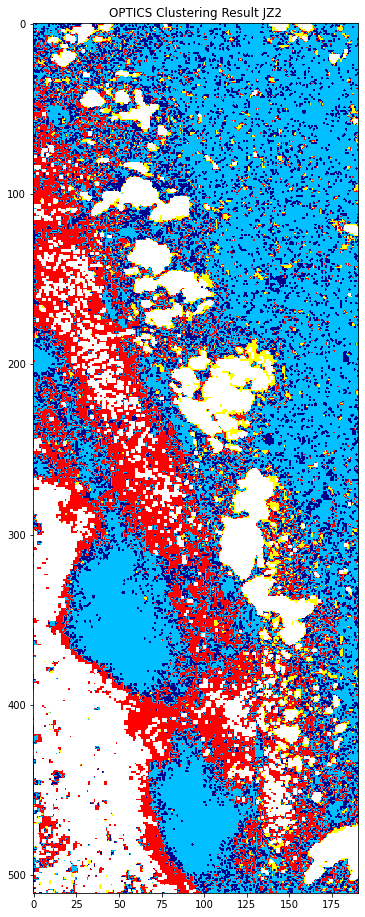

In [211]:
from matplotlib.colors import ListedColormap

color_map = {
    -1: 'darkblue',  
    0: 'deepskyblue',      
    1: 'red',        
    2: 'yellow',     
}

cluster_colors = [color_map[label] for label in sorted(color_map.keys())]
custom_cmap = ListedColormap(cluster_colors)

plt.figure(figsize=(32, 16))
plt.imshow(cluster_with_nans_reshaped_2_2, cmap=custom_cmap)
plt.title("OPTICS Clustering Result JZ2")
plt.savefig('updated_optics_clustering_JZ2.svg', format='svg')
plt.show()

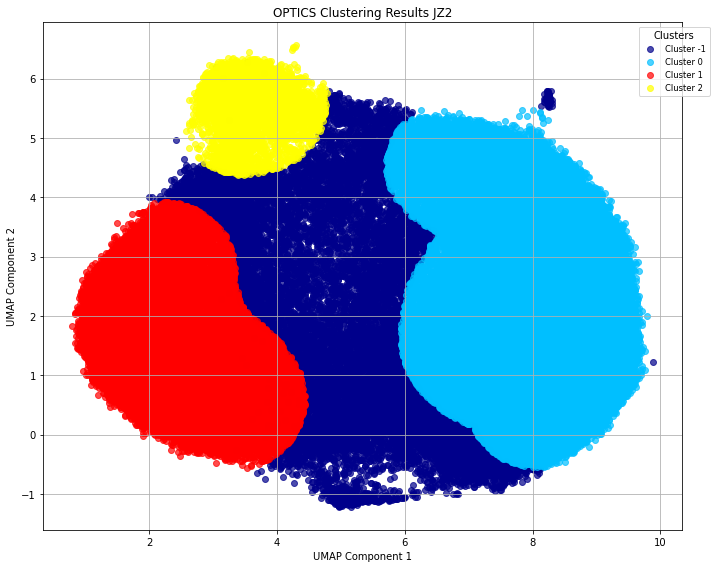

In [213]:
color_map = {
    -1: 'darkblue',  
    0: 'deepskyblue',      
    1: 'red',        
    2: 'yellow',     
}

plt.figure(figsize=(10, 8))
for idx, label in enumerate(unique_labels_2_2):
    color_2_2 = color_map.get(label, 'gray')
    marker_2_2 = 'o' 
    label_name_2_2 = f'Cluster {label}'
    
    mask_2_2 = labels_2_2 == label
    plt.scatter(
        umap_result_JZ2_2[mask_2_2, 0],
        umap_result_JZ2_2[mask_2_2, 1],
        c=[color_2_2],  
        label=label_name_2_2,
        marker=marker_2_2,
        alpha=0.7,
    )

plt.title("OPTICS Clustering Results JZ2")
plt.xlabel("UMAP Component 1")
plt.ylabel("UMAP Component 2")
plt.legend(loc='best', title="Clusters", bbox_to_anchor=(1.05, 1), fontsize='small')
plt.grid(True)
plt.tight_layout()

plt.savefig('updated_optics_clusters_JZ2.svg', format='svg')
plt.show()

In [ ]:
color_map = {
    -1: 'darkblue',  # Noise
    0: 'deepskyblue',      # Cluster 0
    1: 'red',        # Cluster 1
    2: 'yellow',     # Cluster 2
}

all_cluster_averages = []
for i in np.arange(len(flattened_data)):
    cluster_averages = {}
    unique_clusters = np.unique(cluster_reshaped[i])
    unique_clusters = unique_clusters[~np.isnan(unique_clusters)]
    
    for cluster in unique_clusters:
        cluster_mask = cluster_reshaped[i] == cluster
        cluster_data = reshaped_data[i][cluster_mask]
        cluster_average = np.mean(cluster_data, axis=0)
        cluster_averages[int(cluster)] = cluster_average
    
    all_cluster_averages.append(cluster_averages)
    plt.figure(figsize=(12, 8))

    for idx, (cluster, avg_values) in enumerate(cluster_averages.items()):
        color = color_map.get(cluster, 'gray')
        plt.plot(calx, avg_values, label=f"Cluster {cluster}", color=color)
        #np.savetxt(f"avg_spectra_JZ{i+1}_cluster_{cluster}.txt", avg_values)
        
    plt.title(f"Average Values for Each Cluster - JZ{i+1}", fontsize=16)
    plt.xlabel("Calx (800-1800)", fontsize=14)
    plt.ylabel("Average Values", fontsize=14)
    plt.legend(title="Clusters", fontsize=12)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

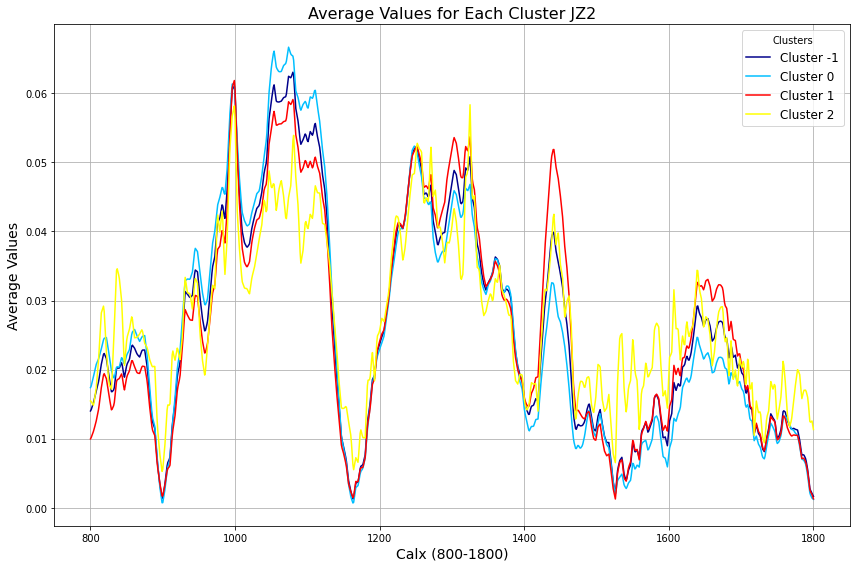

In [214]:
color_map = {
    -1: 'darkblue',  # Noise
    0: 'deepskyblue',      # Cluster 0
    1: 'red',        # Cluster 1
    2: 'yellow',     # Cluster 2
}

cluster_averages_2_2 = {}

unique_clusters_2_2 = np.unique(cluster_with_nans_reshaped_2_2)
unique_clusters_2_2 = unique_clusters_2_2[~np.isnan(unique_clusters_2_2)]

for cluster_2_2 in unique_clusters_2_2:
    cluster_mask_2_2 = cluster_with_nans_reshaped_2_2 == cluster_2_2   
    cluster_data_2_2 = reshaped_data[1][cluster_mask_2_2]
    cluster_average_2_2 = np.mean(cluster_data_2_2, axis=0)  # Shape: (1001,)
    cluster_averages_2_2[int(cluster_2_2)] = cluster_average_2_2

plt.figure(figsize=(12, 8))

for idx_2_2, (cluster_2_2, avg_values_2_2) in enumerate(cluster_averages_2_2.items()):
    color = color_map.get(cluster_2_2, 'gray')
    plt.plot(calx, avg_values_2_2, label=f"Cluster {cluster_2_2}", color=color)
    np.savetxt(f"updated_avg_cluster_{cluster_2_2}_JZ2.txt", avg_values_2_2)
    
plt.title("Average Values for Each Cluster JZ2", fontsize=16)
plt.xlabel("Calx (800-1800)", fontsize=14)
plt.ylabel("Average Values", fontsize=14)
plt.legend(title="Clusters", fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()